# Detectando Fumadores - EDA

<img src="../img/radar.png" alt="Detector de fumadores" width="50%" />

En este Análisis Exploratorio de Datos vamos a incidir en los datos recogidos gracias a los chequeos básicos realizados en múltimples puntos de salud por personal sanitario en el que se recogen biomarcadores básicos como las medidas corporales, la edad, marcadores de analíticas sanguineas básicas, tomas de tensión, etc.

Este análisis nos permitirá observer tendencias, patrones, correlaciones y anomalías en los datos.

Todo esto para poder responder a las preguntas necesarios para un correcto entrenamiento del modelo predictivo. 
Nos planteamos lo siguiente: 
- **¿Qué biomarcadores están más correlacionados con el hecho que el paciente fume?**
- **¿Cuáles son las características demográficas de los fumadores en el conjunto de datos?**
- **¿Hay diferencias significativas en las medidas de salud (como presión arterial, niveles de colesterol) entre fumadores y no fumadores?**
- **¿Existen factores de riesgo identificables para ser fumador que puedan ser revelados por el conjunto de datos?**
- **¿Hay valores atípicos o anomalías en los datos que necesiten ser investigados o tratados?**
- **¿Las bioseñales muestran alguna irregularidad inesperada que necesite una exploración más profunda?**
- **¿Cómo el hábito de fumar afecta otras variables de salud en el conjunto de datos?**

Son algunas de las preguntas que nos podemos hacer para llegar a entender los datos que estamos manejando para mejorar los parámetros del modelo.

En este notebook únicamente utilizaremos el dataset train procesado para hacer el estudio puesto que es el que tiene la columna de si el sujeto es fumador o no.

Para todo ello utilizaremos, como en el resto del proyecto Python e importaremos en este notebook las diferentes bibliotecas para el tratamiento y visualización de los datos:

## Importando Bibliotecas

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.stats import chi2_contingency

## Carga de Datos

In [3]:
train = pd.read_csv('../data/processed/train_p.csv')
print('Archivo cargado')

Archivo cargado


## Análisis

In [7]:
train.shape

(159256, 23)

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159256 entries, 0 to 159255
Data columns (total 23 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   age                  159256 non-null  int64  
 1   height(cm)           159256 non-null  int64  
 2   weight(kg)           159256 non-null  int64  
 3   waist(cm)            159256 non-null  float64
 4   eyesight(left)       159256 non-null  float64
 5   eyesight(right)      159256 non-null  float64
 6   hearing(left)        159256 non-null  int64  
 7   hearing(right)       159256 non-null  int64  
 8   systolic             159256 non-null  int64  
 9   relaxation           159256 non-null  int64  
 10  fasting blood sugar  159256 non-null  int64  
 11  Cholesterol          159256 non-null  int64  
 12  triglyceride         159256 non-null  int64  
 13  HDL                  159256 non-null  int64  
 14  LDL                  159256 non-null  int64  
 15  hemoglobin       

In [6]:
# Ejuctar esto únicamente si queremos desbloquear el límite en opciones para ver 
# todas las columnas en las visualizaciones de los df

pd.set_option('display.max_columns', None)

In [5]:
descripcion = train.describe(include='all') # El include='all' para ver todas las columnas
descripcion.transpose() # Resulta más cómodo de visualizar al tener tantas columnas

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,159256.0,NaN,NaN,NaN,44.306626,11.842286,20.0,40.0,40.0,55.0,85.0
height(cm),159256.0,NaN,NaN,NaN,165.266929,8.81897,135.0,160.0,165.0,170.0,190.0
weight(kg),159256.0,NaN,NaN,NaN,67.143662,12.586198,30.0,60.0,65.0,75.0,130.0
waist(cm),159256.0,NaN,NaN,NaN,83.00199,8.957937,51.0,77.0,83.0,89.0,127.0
eyesight(left),159256.0,NaN,NaN,NaN,1.005798,0.402113,0.1,0.8,1.0,1.2,9.9
eyesight(right),159256.0,NaN,NaN,NaN,1.000989,0.392299,0.1,0.8,1.0,1.2,9.9
hearing(left),159256.0,NaN,NaN,NaN,1.023974,0.152969,1.0,1.0,1.0,1.0,2.0
hearing(right),159256.0,NaN,NaN,NaN,1.023421,0.151238,1.0,1.0,1.0,1.0,2.0
systolic,159256.0,NaN,NaN,NaN,122.503648,12.729315,77.0,114.0,121.0,130.0,213.0
relaxation,159256.0,NaN,NaN,NaN,76.874071,8.994642,44.0,70.0,78.0,82.0,133.0


In [4]:
# Convertimos a booleanos los dos que tenemos claro para que no molesten en las visualizaciones
train['dental caries'] = train['dental caries'].astype(bool)
train['smoking'] = train['smoking'].astype(bool)

In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159256 entries, 0 to 159255
Data columns (total 23 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   age                  159256 non-null  int64  
 1   height(cm)           159256 non-null  int64  
 2   weight(kg)           159256 non-null  int64  
 3   waist(cm)            159256 non-null  float64
 4   eyesight(left)       159256 non-null  float64
 5   eyesight(right)      159256 non-null  float64
 6   hearing(left)        159256 non-null  int64  
 7   hearing(right)       159256 non-null  int64  
 8   systolic             159256 non-null  int64  
 9   relaxation           159256 non-null  int64  
 10  fasting blood sugar  159256 non-null  int64  
 11  Cholesterol          159256 non-null  int64  
 12  triglyceride         159256 non-null  int64  
 13  HDL                  159256 non-null  int64  
 14  LDL                  159256 non-null  int64  
 15  hemoglobin       

In [10]:
train.duplicated().sum()

0

### Univariante

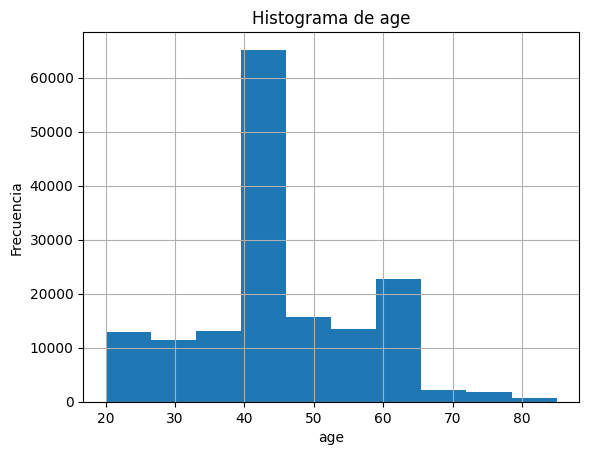

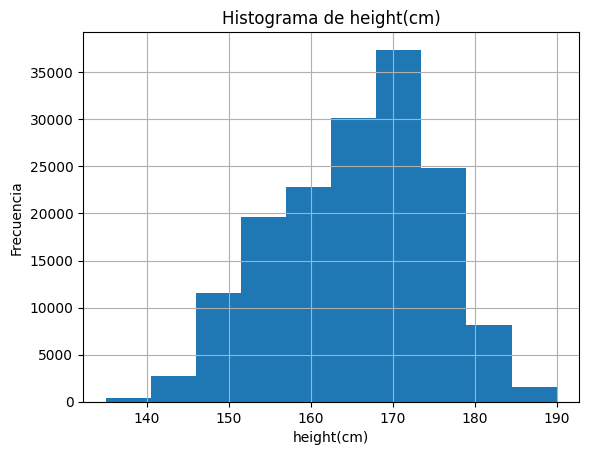

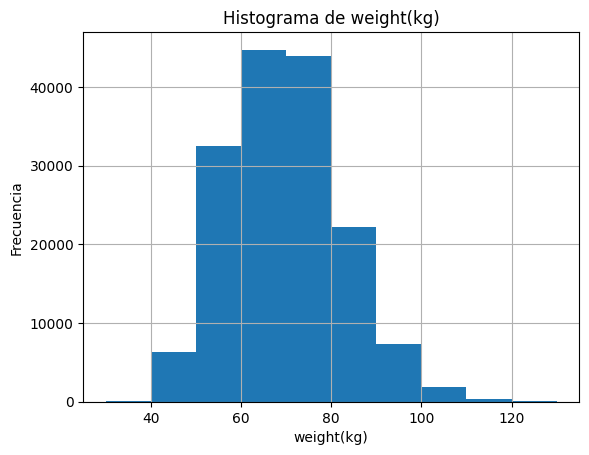

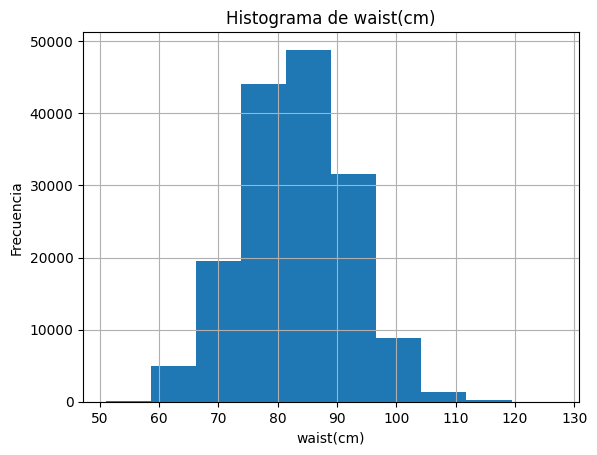

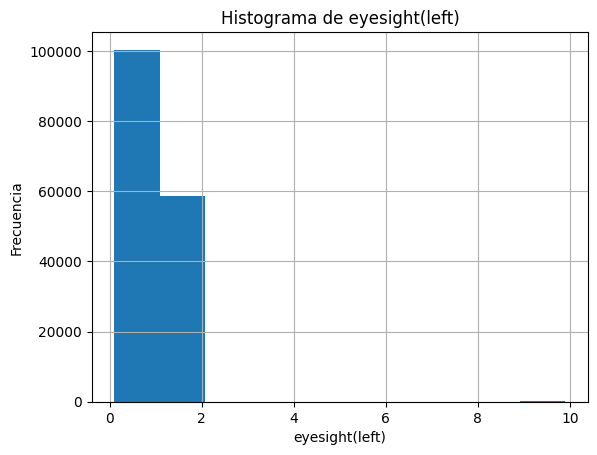

...

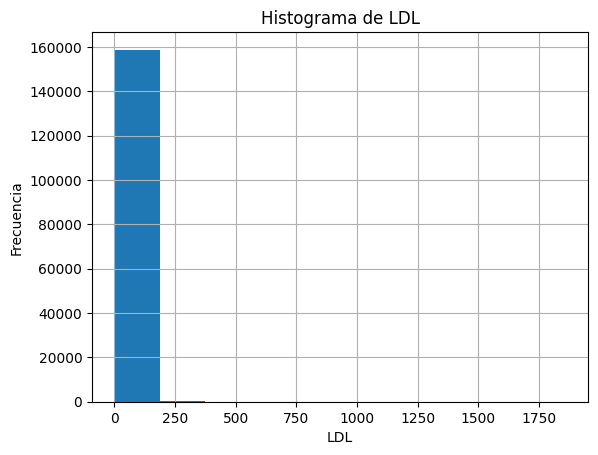

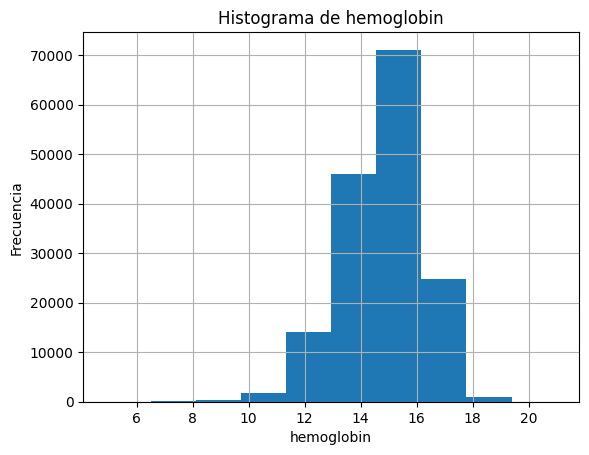

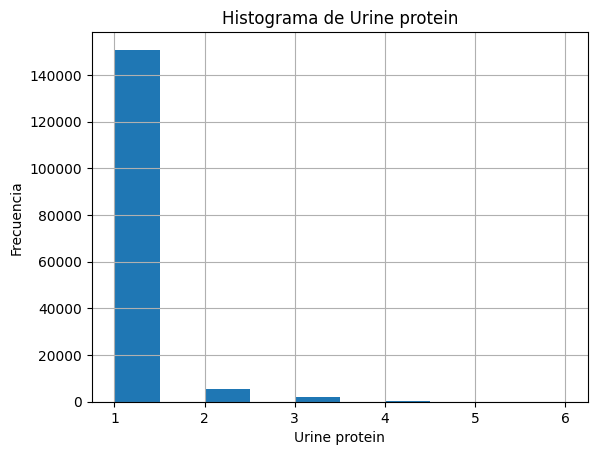

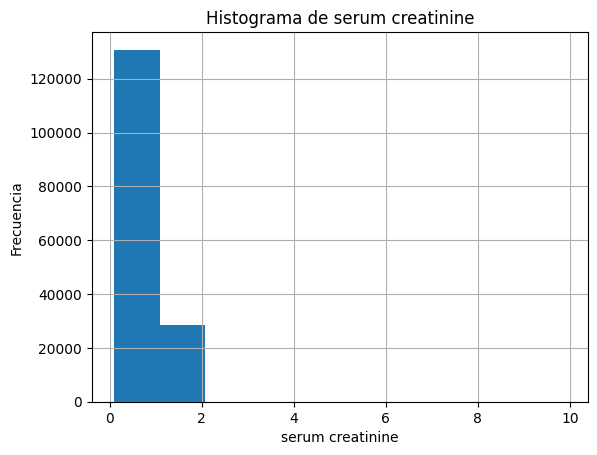

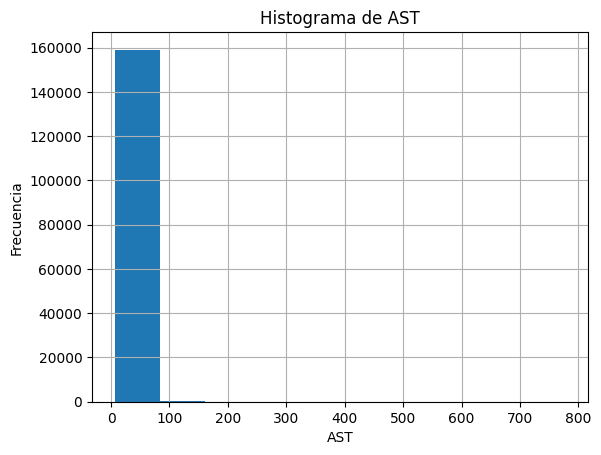

KeyboardInterrupt: 

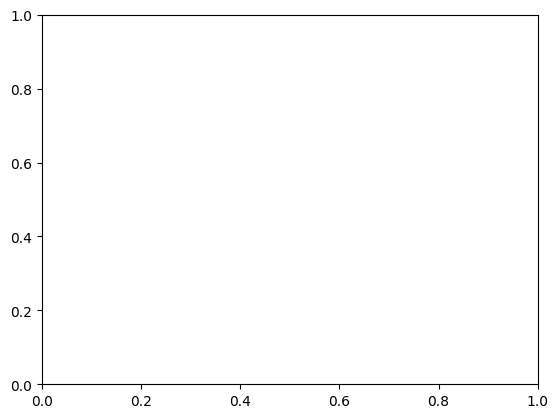

In [11]:
for column in train.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure()  # Crea una nueva figura
    train[column].hist()
    plt.title(f'Histograma de {column}')
    plt.xlabel(column)
    plt.ylabel('Frecuencia')
    plt.show()

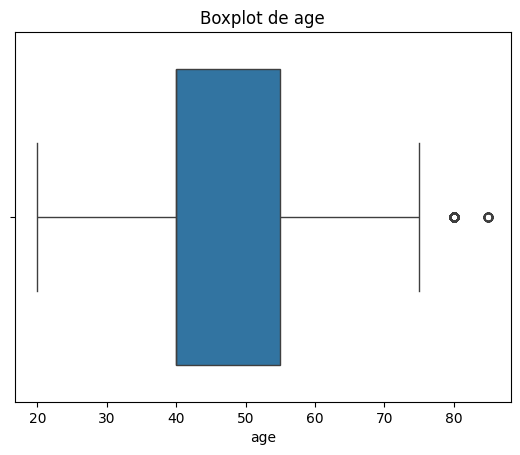

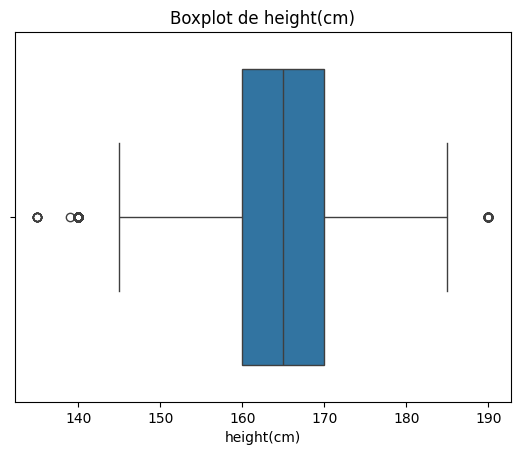

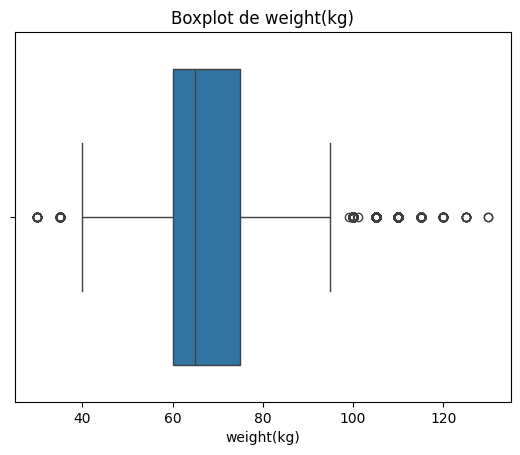

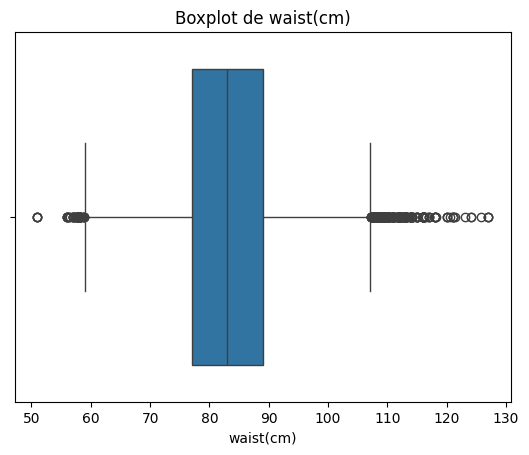

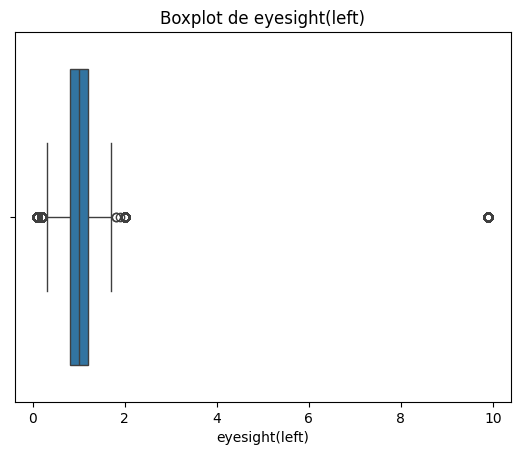

...

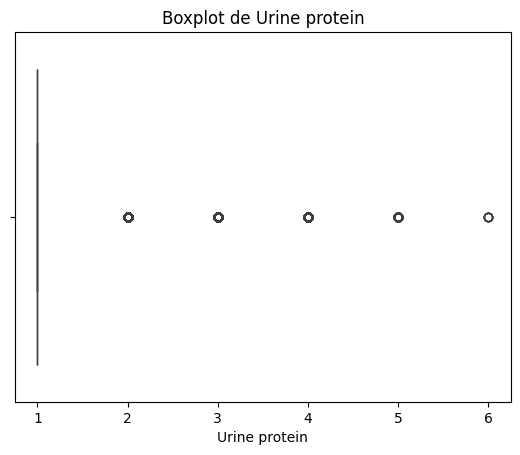

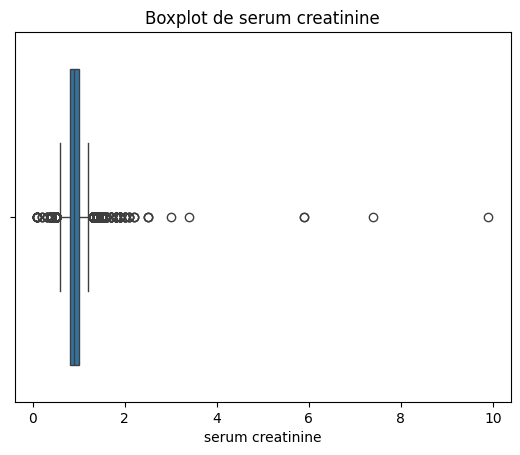

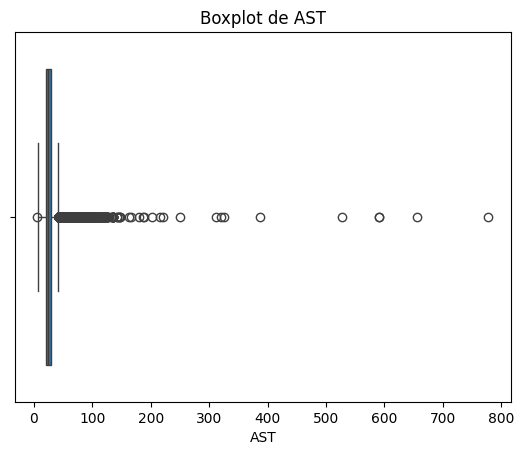

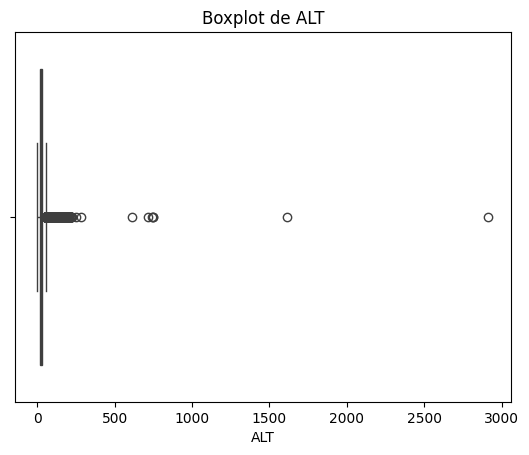

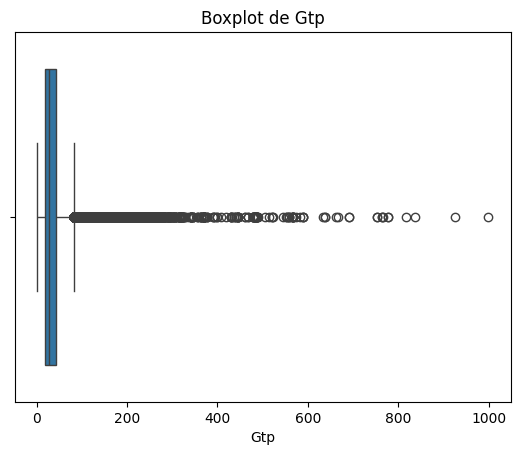

In [28]:
for column in train.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure()  # Crea una nueva figura
    sns.boxplot(x=train[column])
    plt.title(f'Boxplot de {column}')
    plt.show()

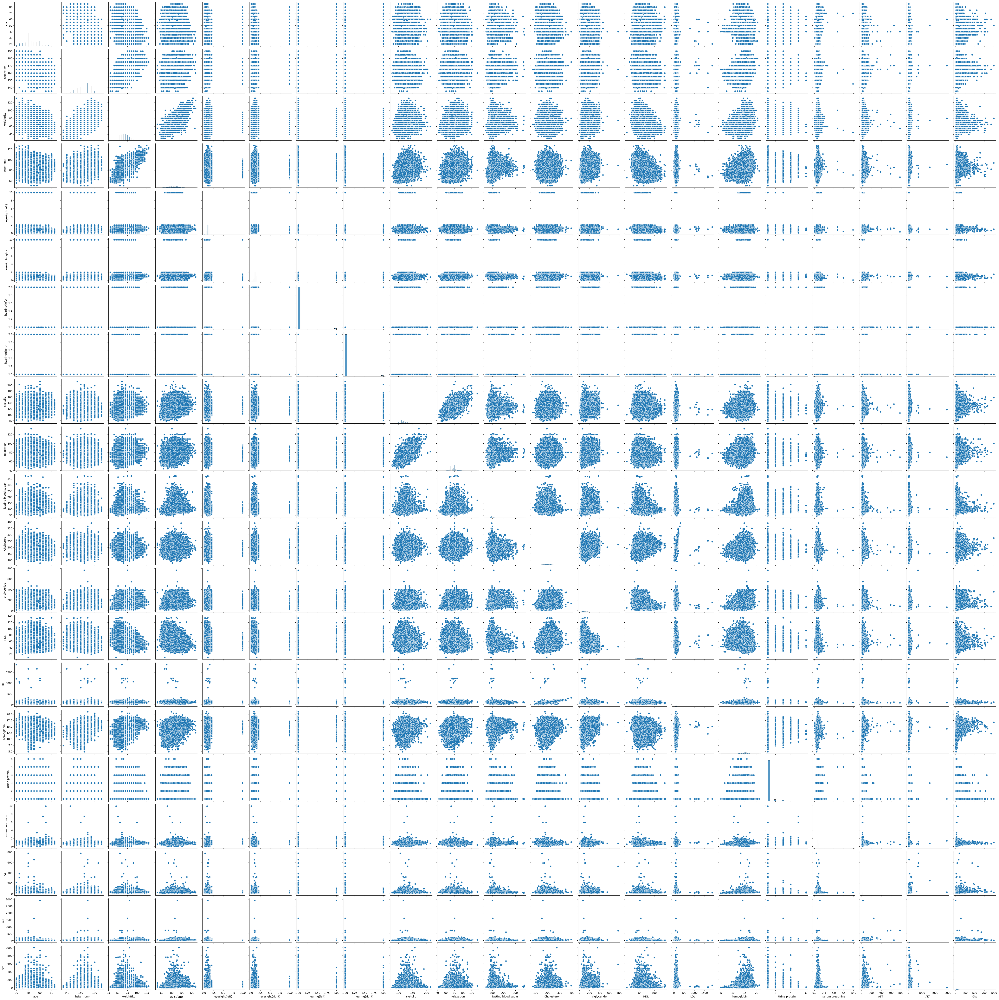

In [29]:
sns.pairplot(train.select_dtypes(include=['float64', 'int64']))
plt.show()

In [12]:
numerical_train = train.select_dtypes(include=['int64', 'float64'])

outliers_count = {}
for column in numerical_train.columns:
    Q1 = numerical_train[column].quantile(0.25)
    Q3 = numerical_train[column].quantile(0.75)
    IQR = Q3 - Q1
    outliers = numerical_train[(numerical_train[column] < (Q1 - 1.5 * IQR)) | (numerical_train[column] > (Q3 + 1.5 * IQR))]
    outliers_count[column] = len(outliers)

total_observations = len(numerical_train)
outliers_table = pd.DataFrame(list(outliers_count.items()), columns=['Variable', 'Número de valores atípicos'])
outliers_table['Total de datos'] = total_observations
outliers_table['Proporción de valores atípicos (%)'] = (outliers_table['Número de valores atípicos'] / total_observations) * 100

print(outliers_table)


               Variable  Número de valores atípicos  Total de datos  \
0                   age                         682          159256   
1            height(cm)                         463          159256   
2            weight(kg)                        2296          159256   
3             waist(cm)                         858          159256   
4        eyesight(left)                        2324          159256   
5       eyesight(right)                        2493          159256   
6         hearing(left)                        3818          159256   
7        hearing(right)                        3730          159256   
8              systolic                        1592          159256   
9            relaxation                         981          159256   
10  fasting blood sugar                        8160          159256   
11          Cholesterol                         430          159256   
12         triglyceride                        3087          159256   
13    

In [13]:
outlier_indices = set()

for column in train.columns:
    if train[column].dtype in ['int64', 'float64']:
        Q1 = train[column].quantile(0.25)
        Q3 = train[column].quantile(0.75)
        IQR = Q3 - Q1
        
        outliers = train[(train[column] < (Q1 - 1.5 * IQR)) | (train[column] > (Q3 + 1.5 * IQR))]
        
        outlier_indices.update(outliers.index)

total_unique_outliers = len(outlier_indices)
total_observations = len(train)

proportion_unique_outliers = total_unique_outliers / total_observations

print(f'Número total de observaciones únicas con valores atípicos: {total_unique_outliers}')
print(f'Proporción de observaciones únicas con valores atípicos: {proportion_unique_outliers:.2%}')

Número total de observaciones únicas con valores atípicos: 51503
Proporción de observaciones únicas con valores atípicos: 32.34%


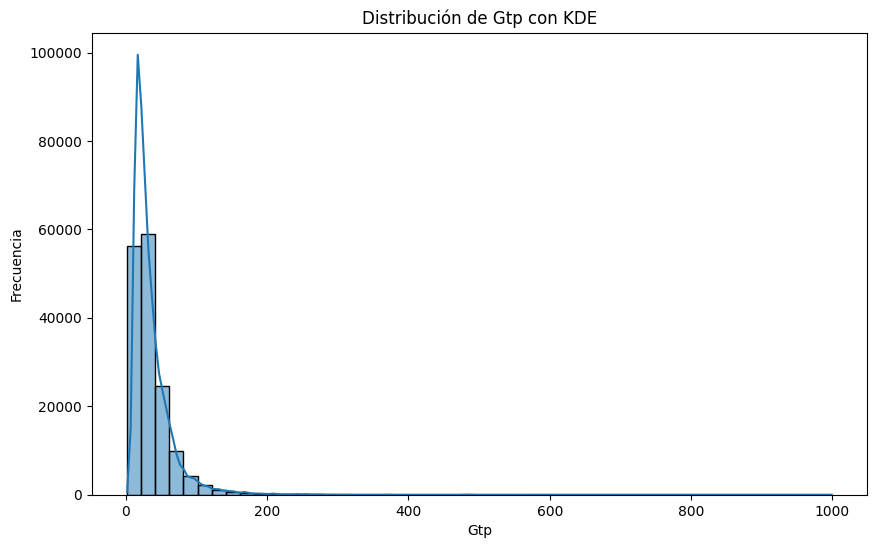

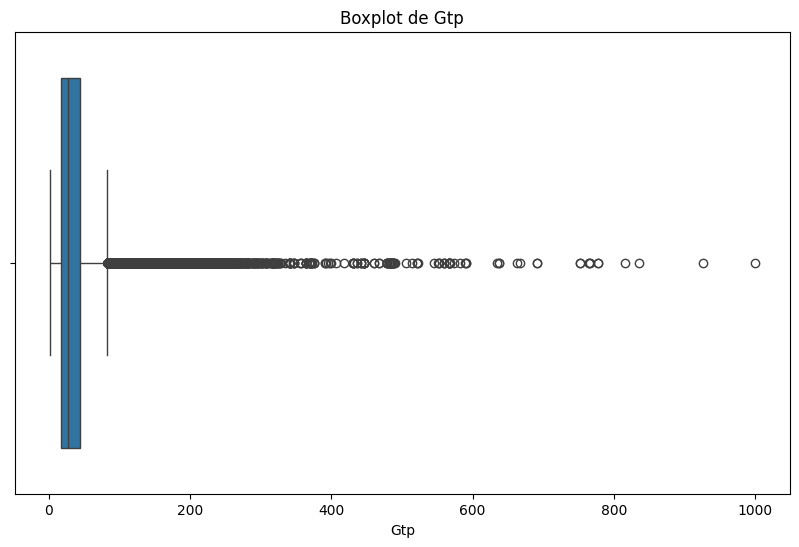

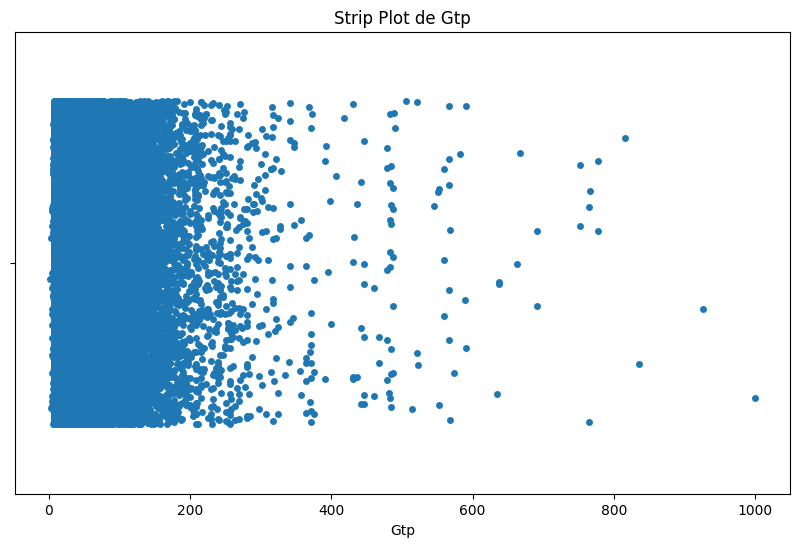

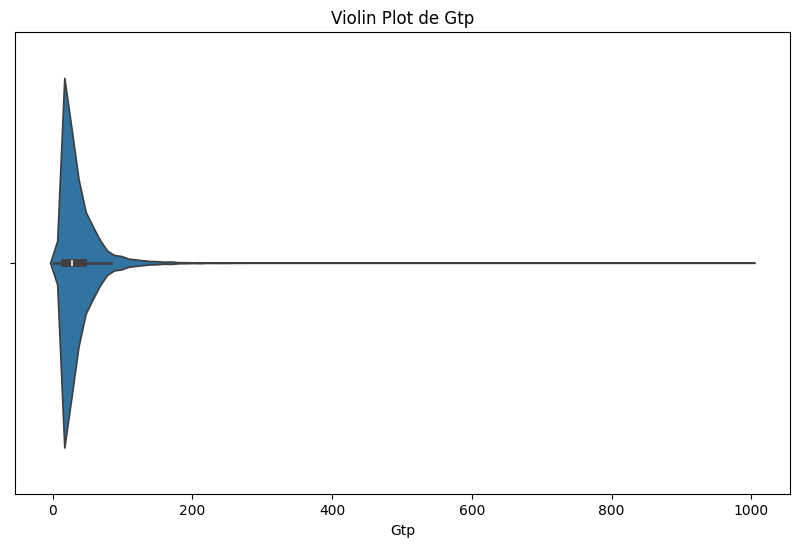

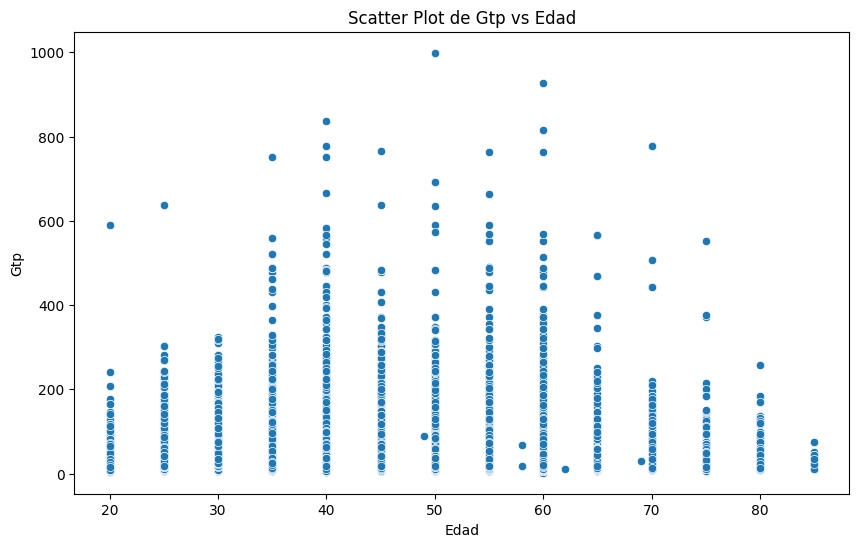

<Figure size 1000x600 with 0 Axes>

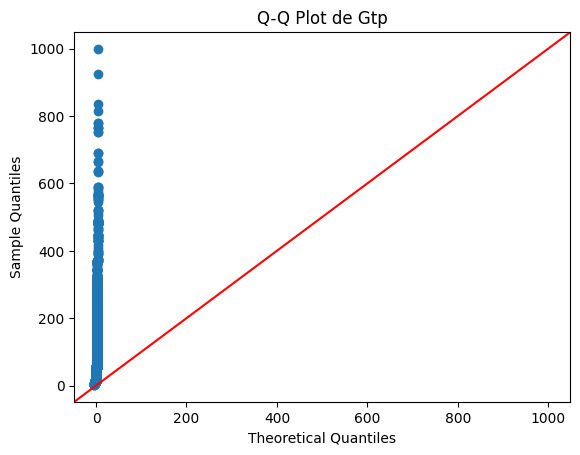

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt


# Histograma detallado
plt.figure(figsize=(10, 6))
sns.histplot(train['Gtp'], bins=50, kde=True)
plt.title('Distribución de Gtp con KDE')
plt.xlabel('Gtp')
plt.ylabel('Frecuencia')
plt.show()

# Boxplot mejorado
plt.figure(figsize=(10, 6))
sns.boxplot(x=train['Gtp'])
plt.title('Boxplot de Gtp')
plt.xlabel('Gtp')
plt.show()

# Strip plot
plt.figure(figsize=(10, 6))
sns.stripplot(x=train['Gtp'], jitter=0.35)
plt.title('Strip Plot de Gtp')
plt.xlabel('Gtp')
plt.show()

# Violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x=train['Gtp'])
plt.title('Violin Plot de Gtp')
plt.xlabel('Gtp')
plt.show()

# Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='Gtp', data=train)
plt.title('Scatter Plot de Gtp vs Edad')
plt.xlabel('Edad')
plt.ylabel('Gtp')
plt.show()

# Q-Q plot
import statsmodels.api as sm
import numpy as np

plt.figure(figsize=(10, 6))
sm.qqplot(train['Gtp'], line ='45')
plt.title('Q-Q Plot de Gtp')
plt.show()


### Bivariante

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


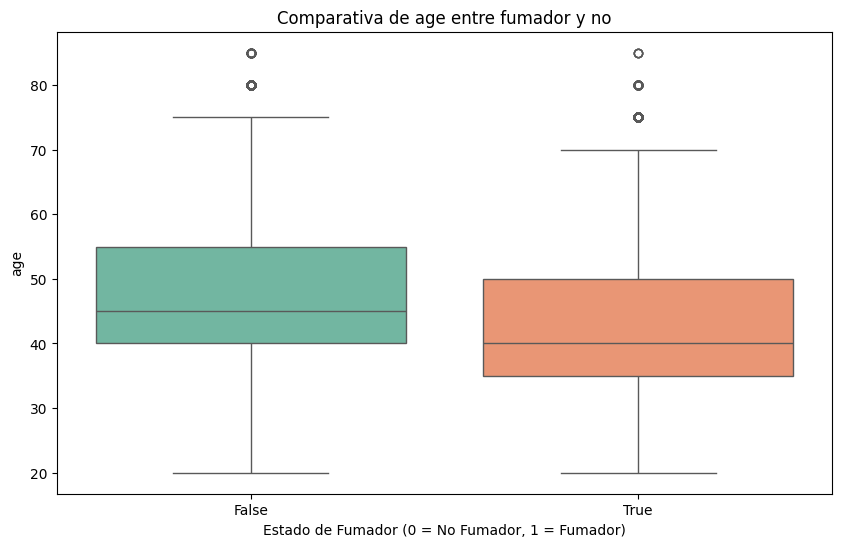

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


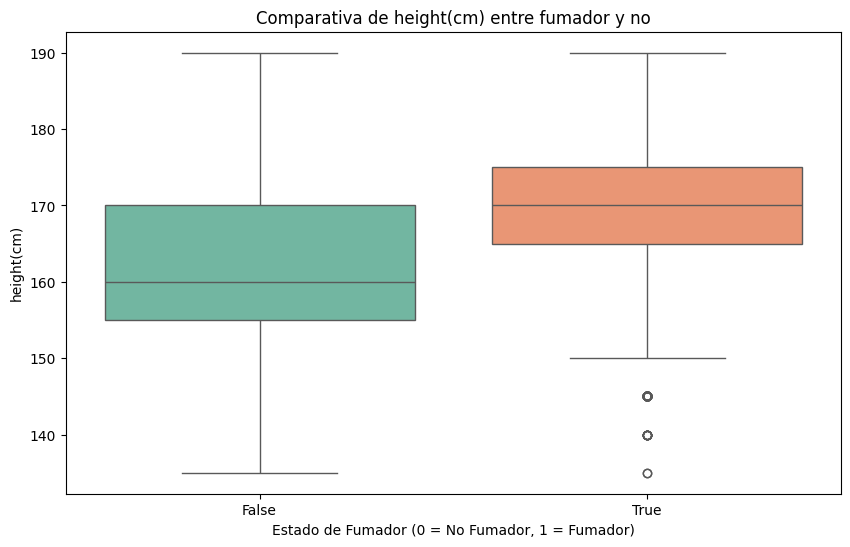

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


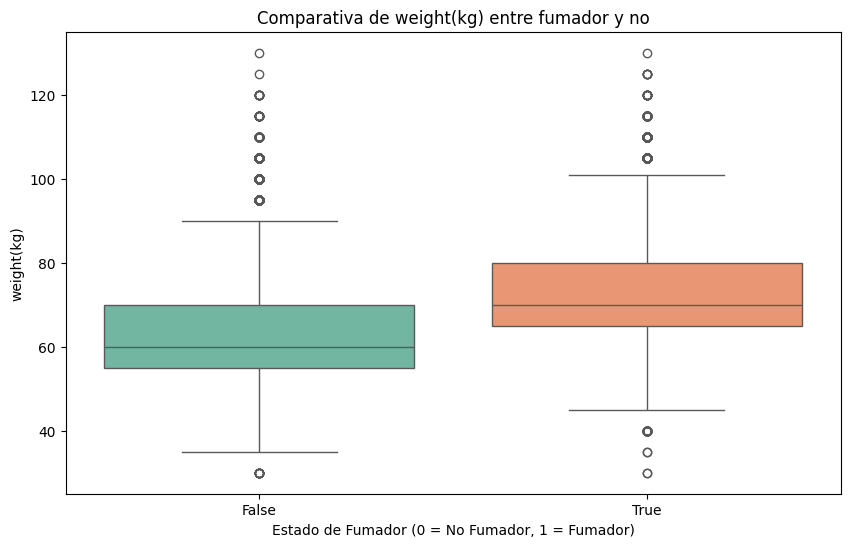

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


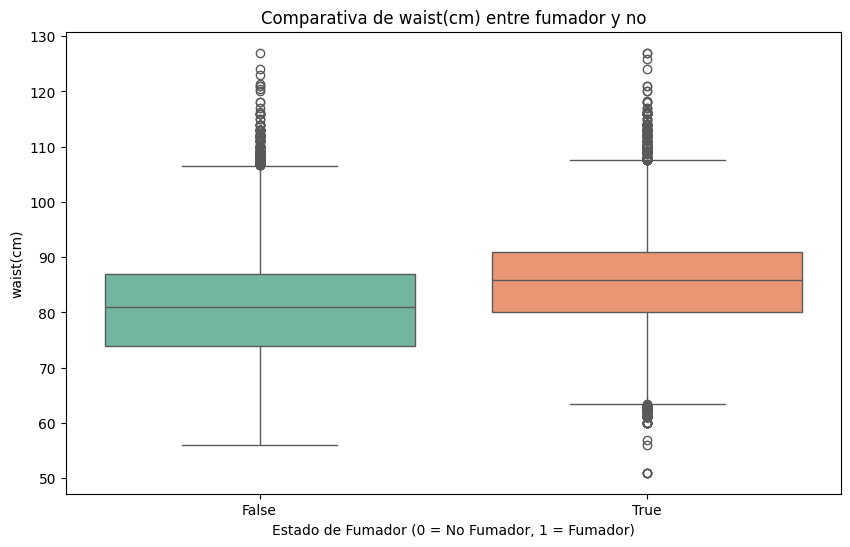

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


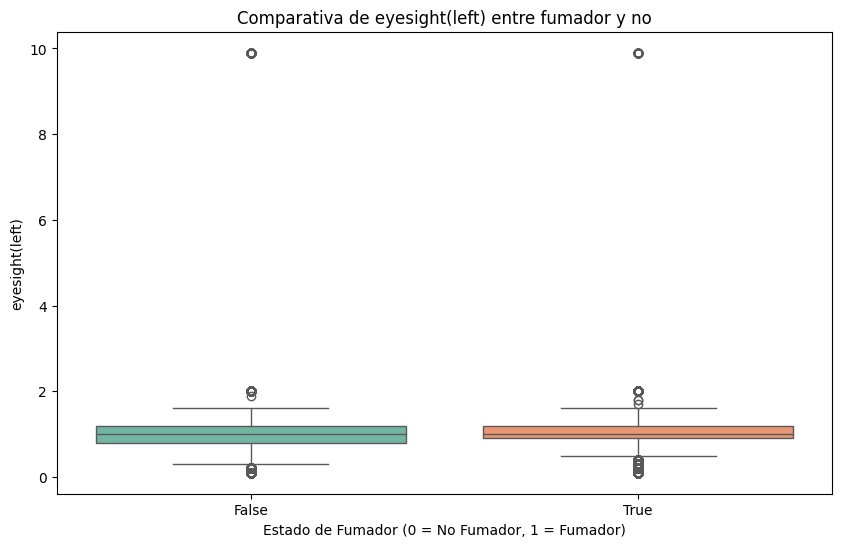

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


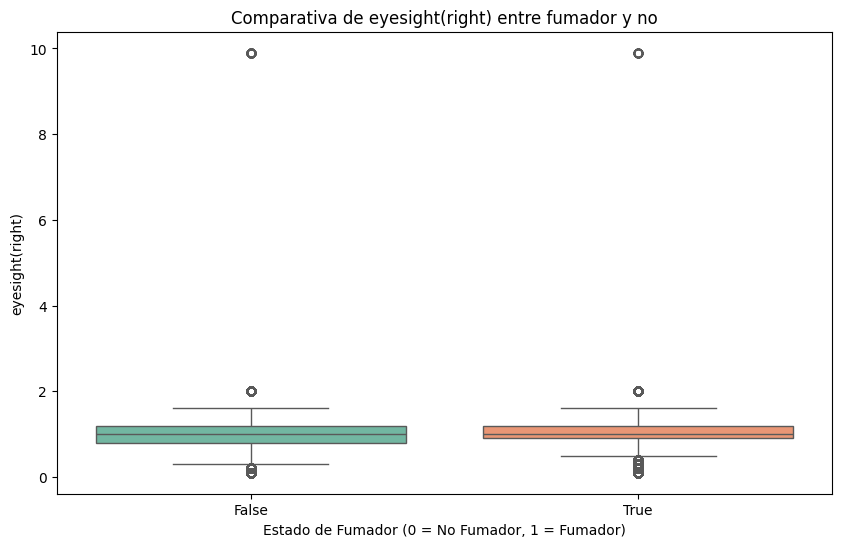

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


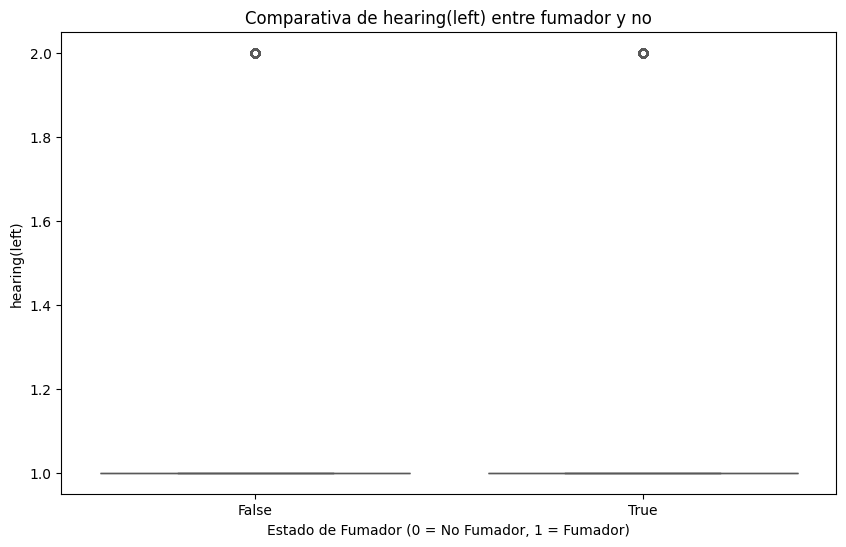

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


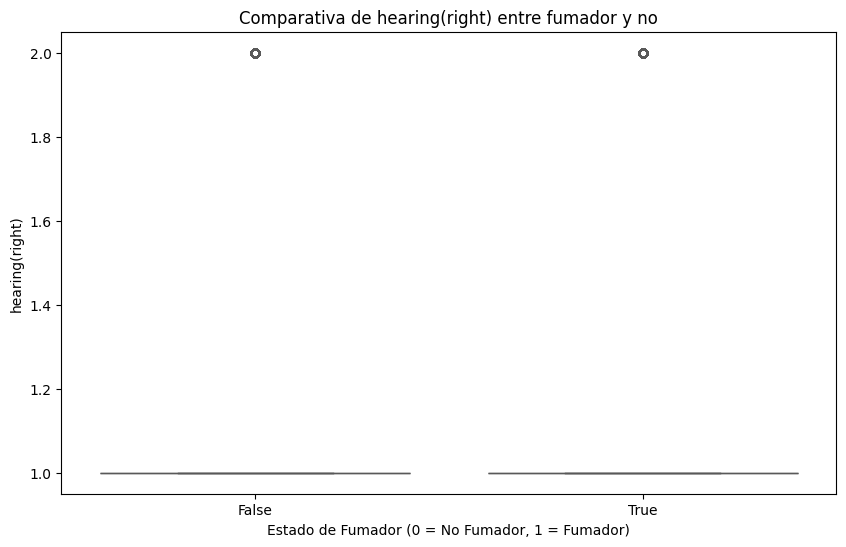

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


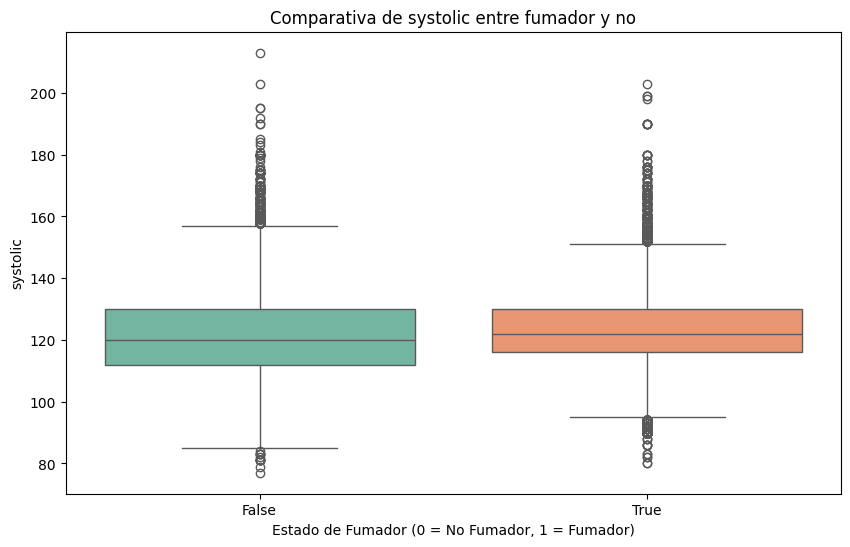

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


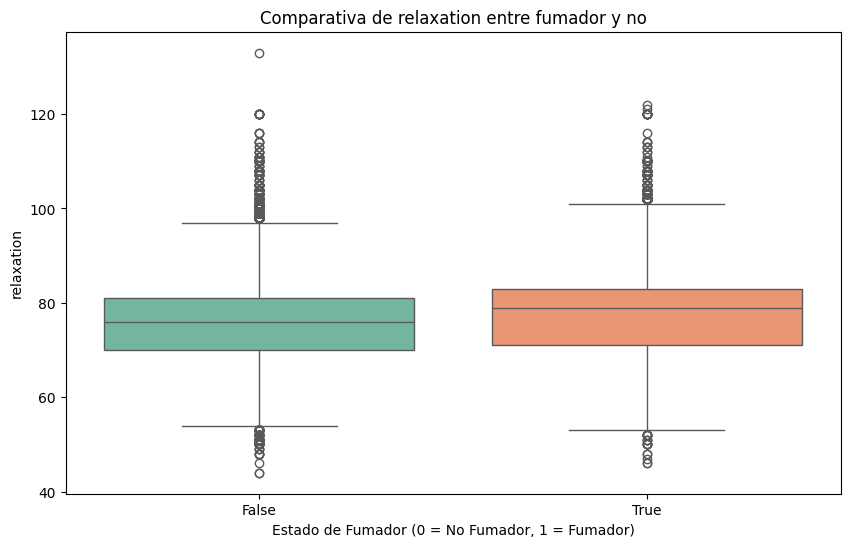

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


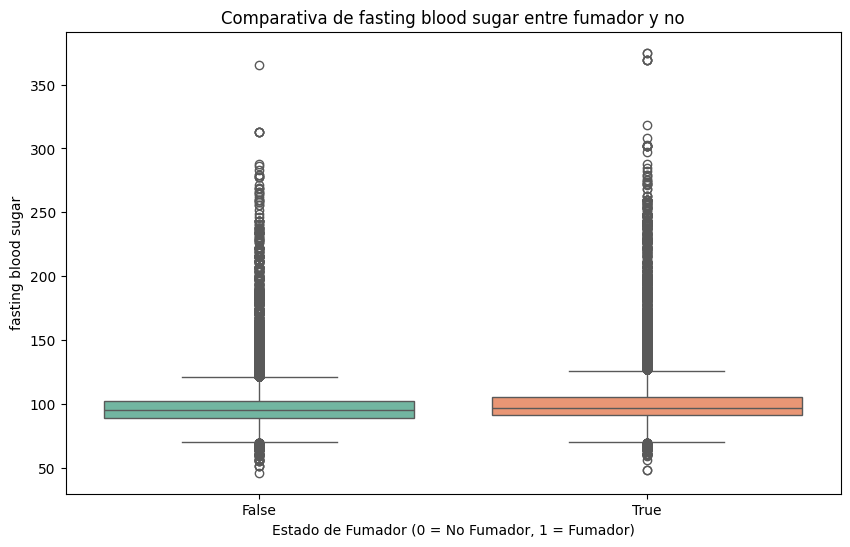

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


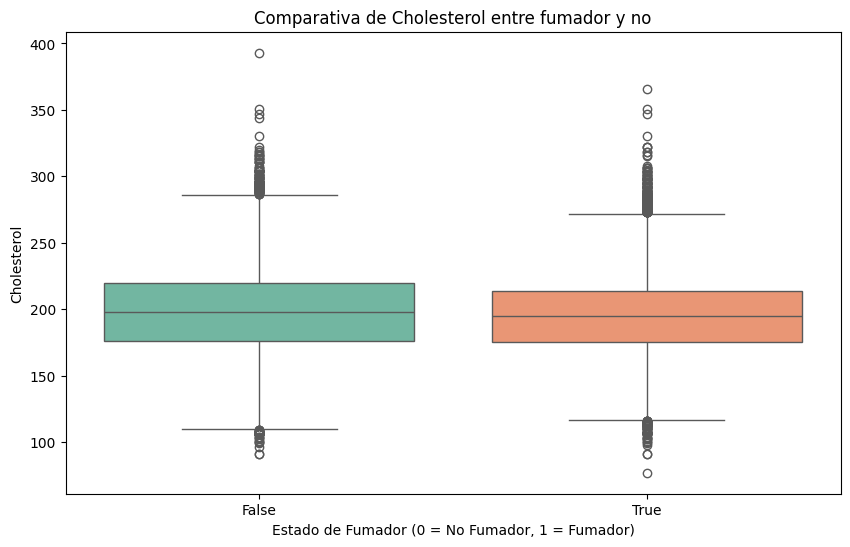

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


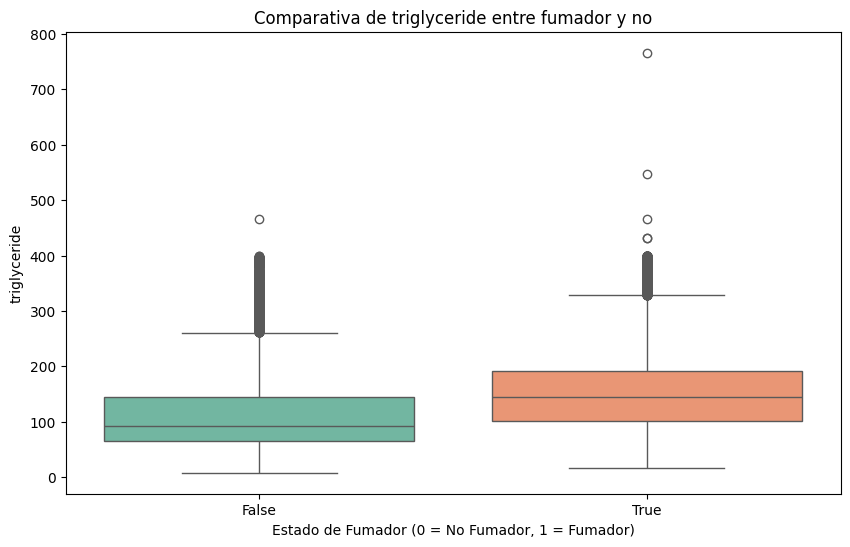

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


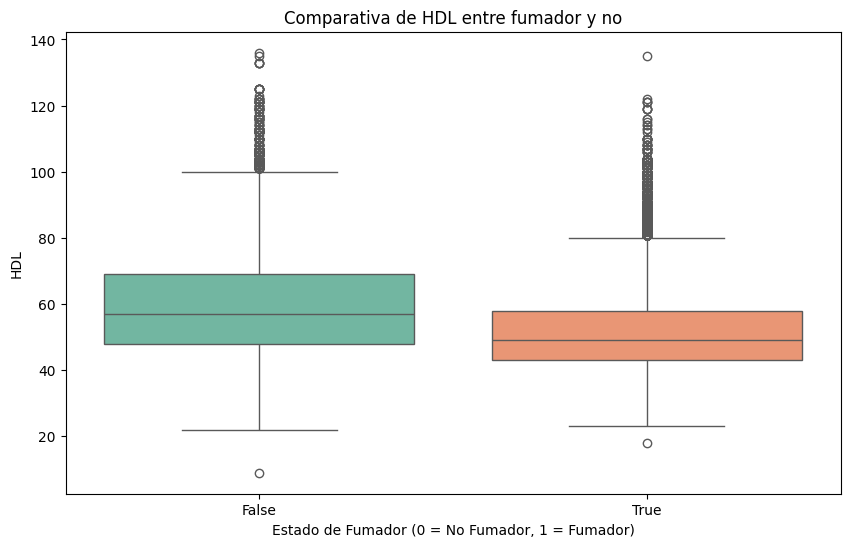

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


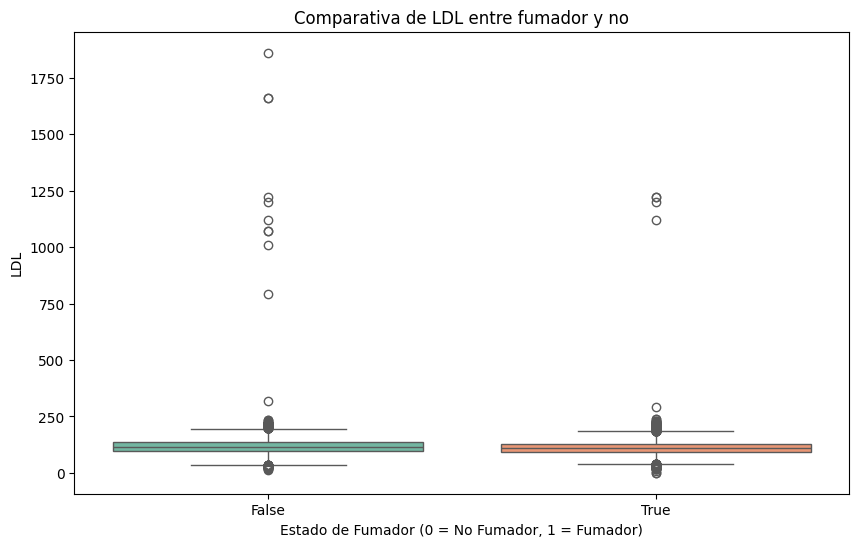

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


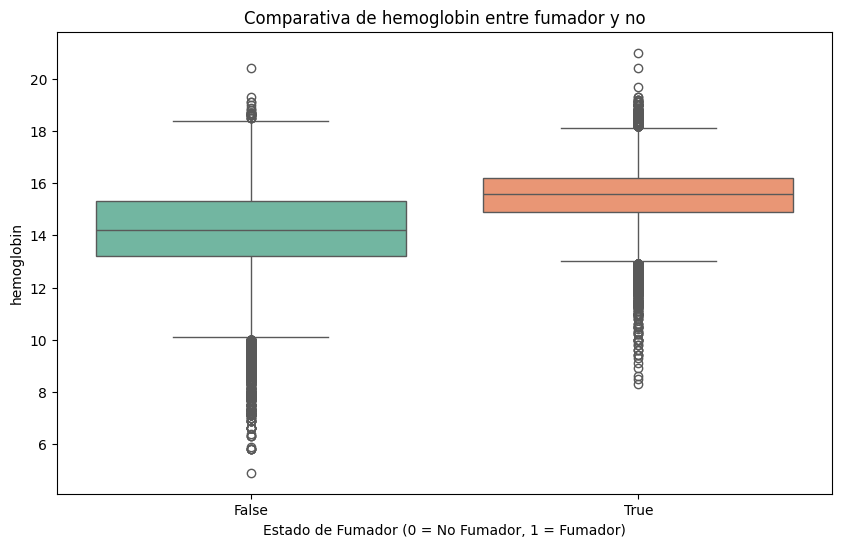

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


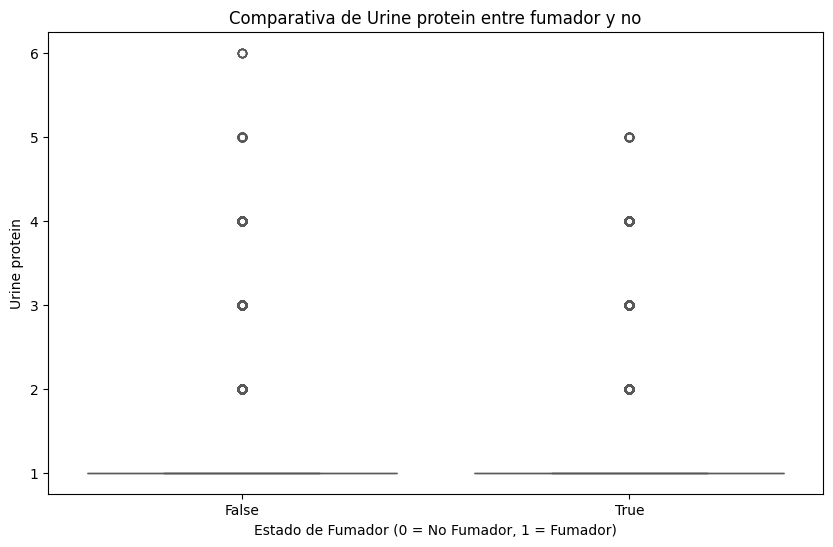

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


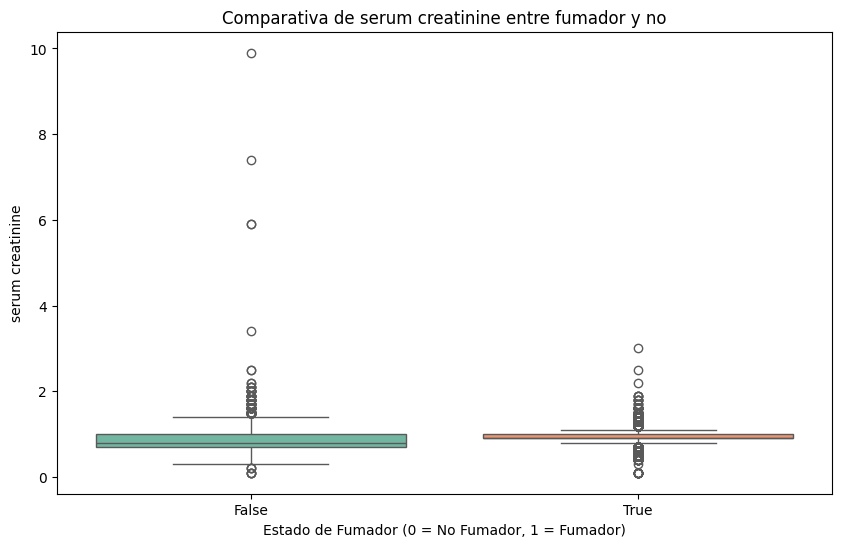

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


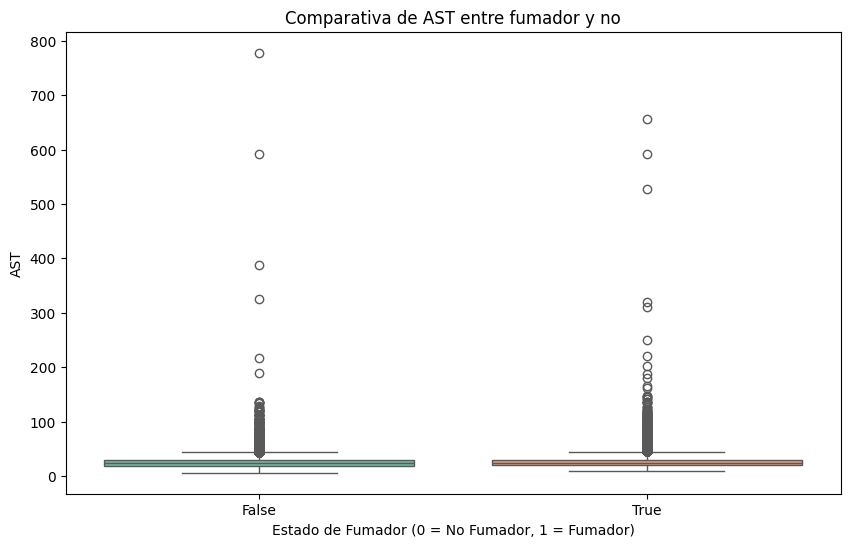

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


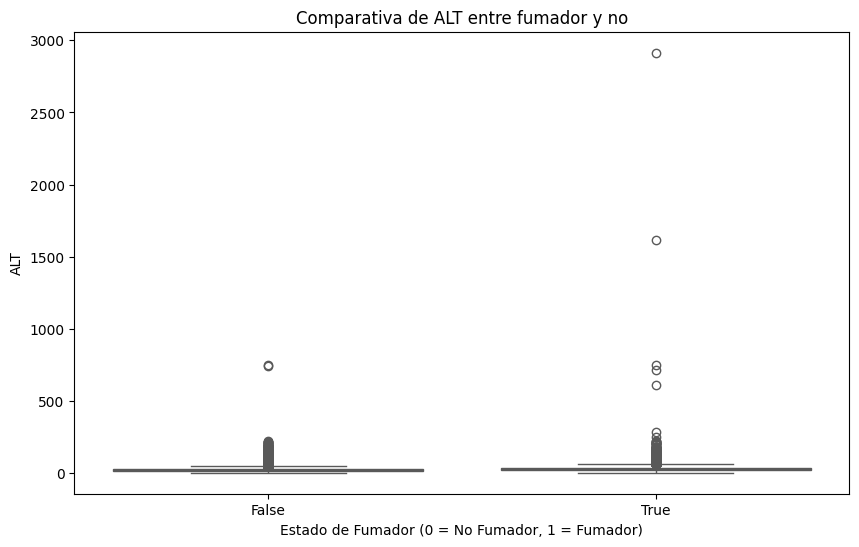

/var/folders/dk/y0lym97s13g52x50m8y8qycc0000gn/T/ipykernel_65967/2542429322.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='smoking', y=column, data=train, palette="Set2")


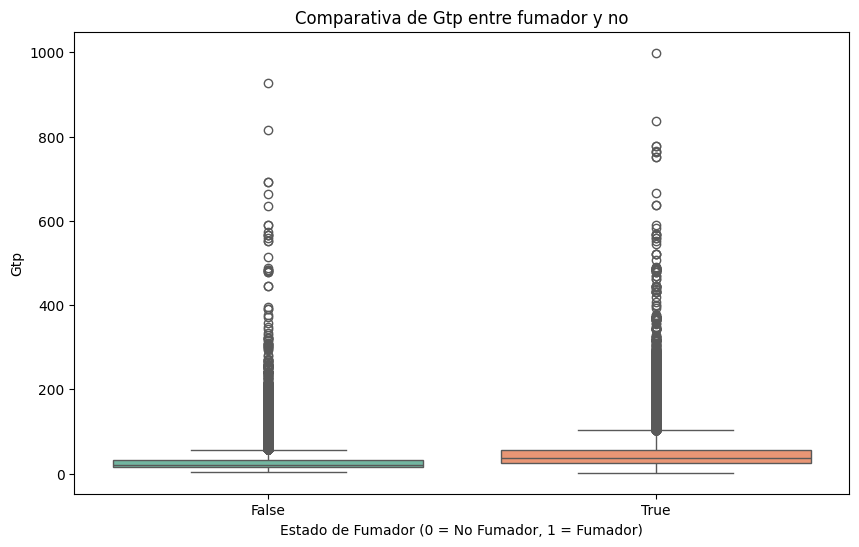

In [45]:
for column in train.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure(figsize=(10, 6))  # Ajusta el tamaño de la figura a tus necesidades
    # Crea el boxplot con un tono para fumadores vs no fumadores
    sns.boxplot(x='smoking', y=column, data=train, palette="Set2")
    plt.title(f'Comparativa de {column} entre fumador y no')
    plt.xlabel('Estado de Fumador (0 = No Fumador, 1 = Fumador)')
    plt.ylabel(column)
    plt.show()

### Multivariante

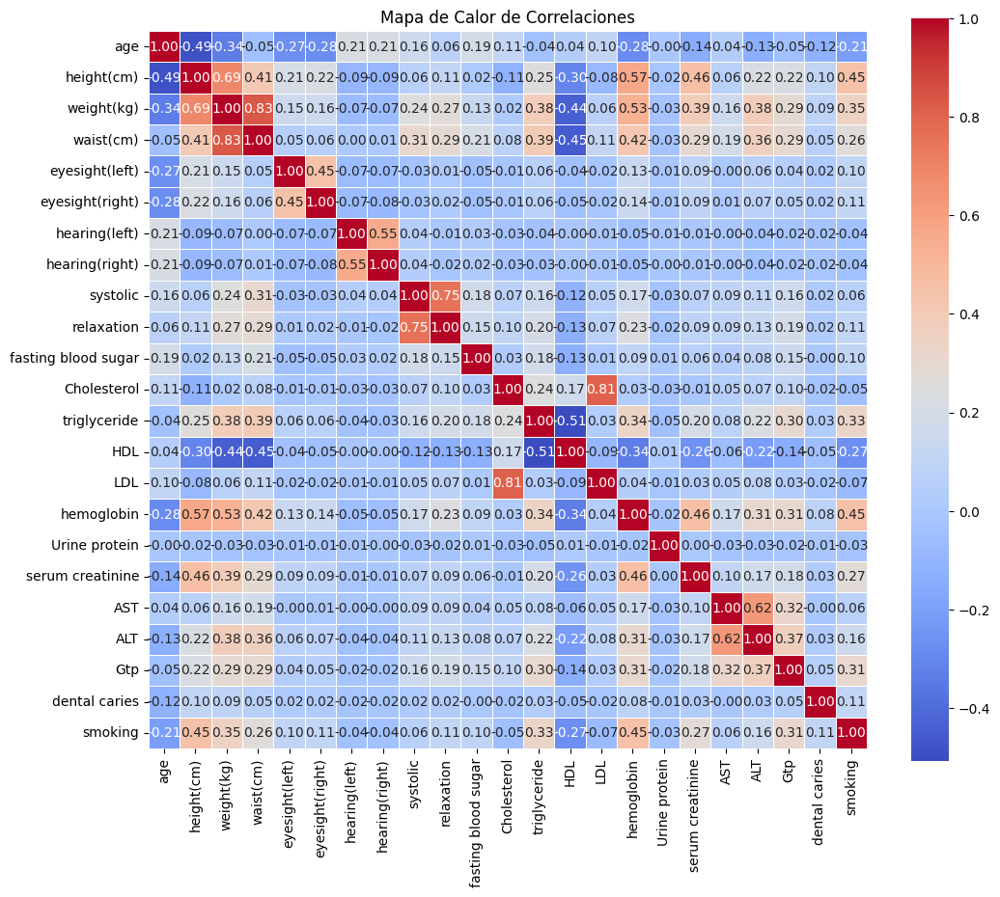

In [46]:
correlation_matrix = train.corr()

# Ahora, creamos el mapa de calor usando Seaborn
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)
plt.title('Mapa de Calor de Correlaciones')
plt.show()

In [50]:
fumadores = train[train['smoking'] == 1]
fumadores = fumadores.drop('smoking', axis=1)
no_fumadores = train[train['smoking'] == 0]
no_fumadores = no_fumadores.drop('smoking', axis=1)

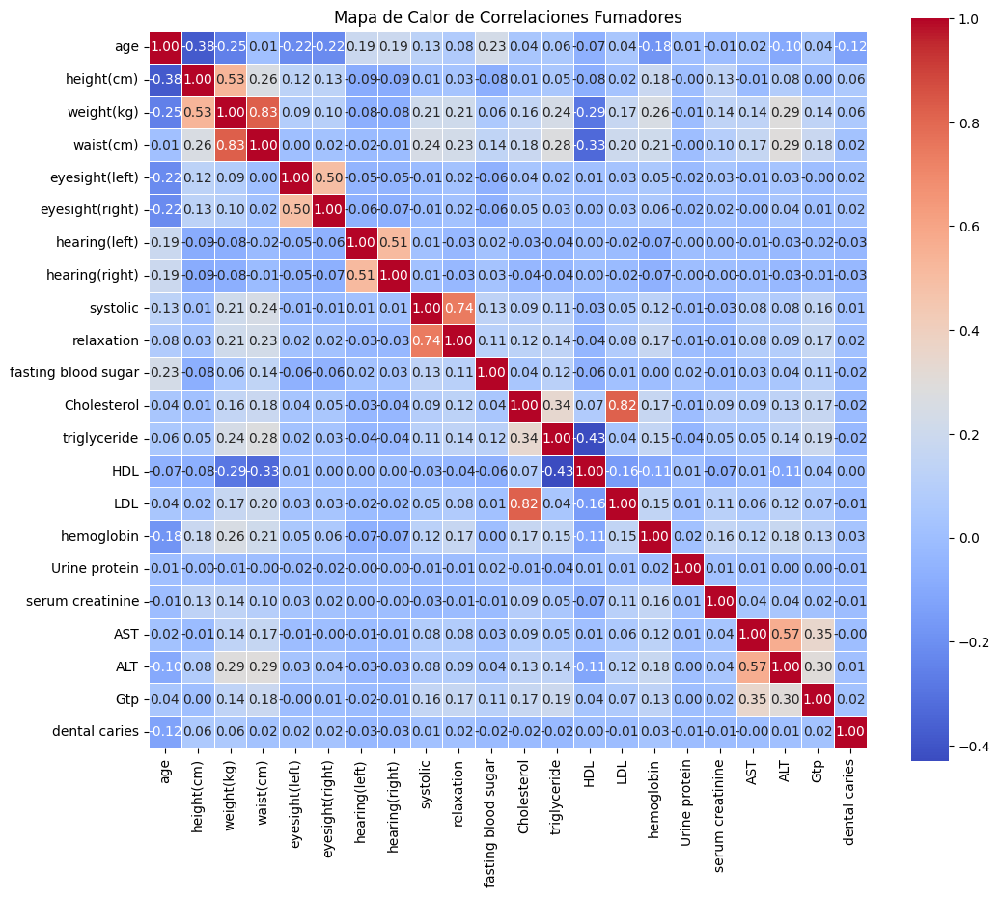

In [51]:
correlation_matrix_f = fumadores.corr()

plt.figure(figsize=(12, 10)) 
sns.heatmap(correlation_matrix_f, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)
plt.title('Mapa de Calor de Correlaciones Fumadores')
plt.show()

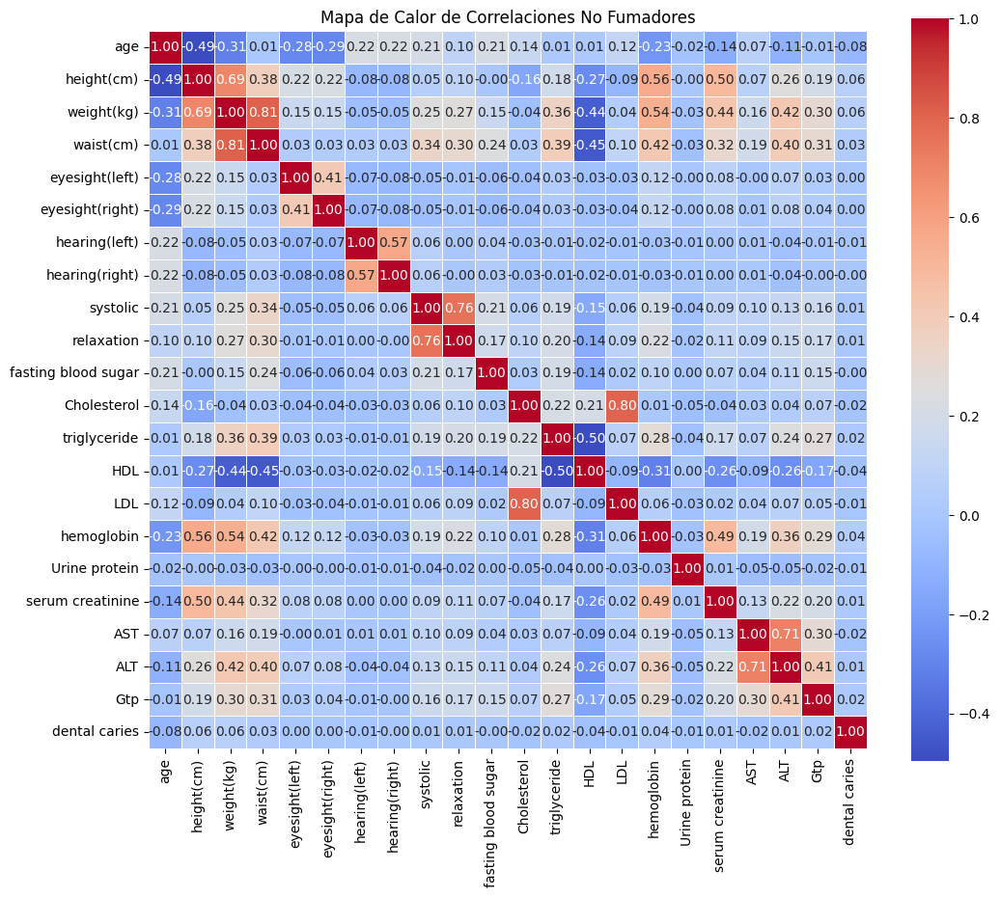

In [52]:
correlation_matrix_nf = no_fumadores.corr()

# Ahora, creamos el mapa de calor usando Seaborn
plt.figure(figsize=(12, 10)) 
sns.heatmap(correlation_matrix_nf, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)
plt.title('Mapa de Calor de Correlaciones No Fumadores')
plt.show()

Probamos con otro tipo de visualización para acabar de ver posibles anomalías en los datos:

In [17]:
train.columns

Index(['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)',
       'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic',
       'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride',
       'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST',
       'ALT', 'Gtp', 'dental caries', 'smoking'],
      dtype='object')

In [19]:
train_0a4 = train.columns[0:4].tolist()
train_5a9 = train.columns[5:9].tolist()
train_10a14 = train.columns[10:14].tolist()
train_15a19 = train.columns[15:19].tolist()

train_0a4.append('smoking') 
train_5a9.append('smoking')
train_10a14.append('smoking')
train_15a19.append('smoking')

train_set1 = train[train_0a4]
train_set2 = train[train_5a9]
train_set3 = train[train_10a14]
train_set4 = train[train_15a19]

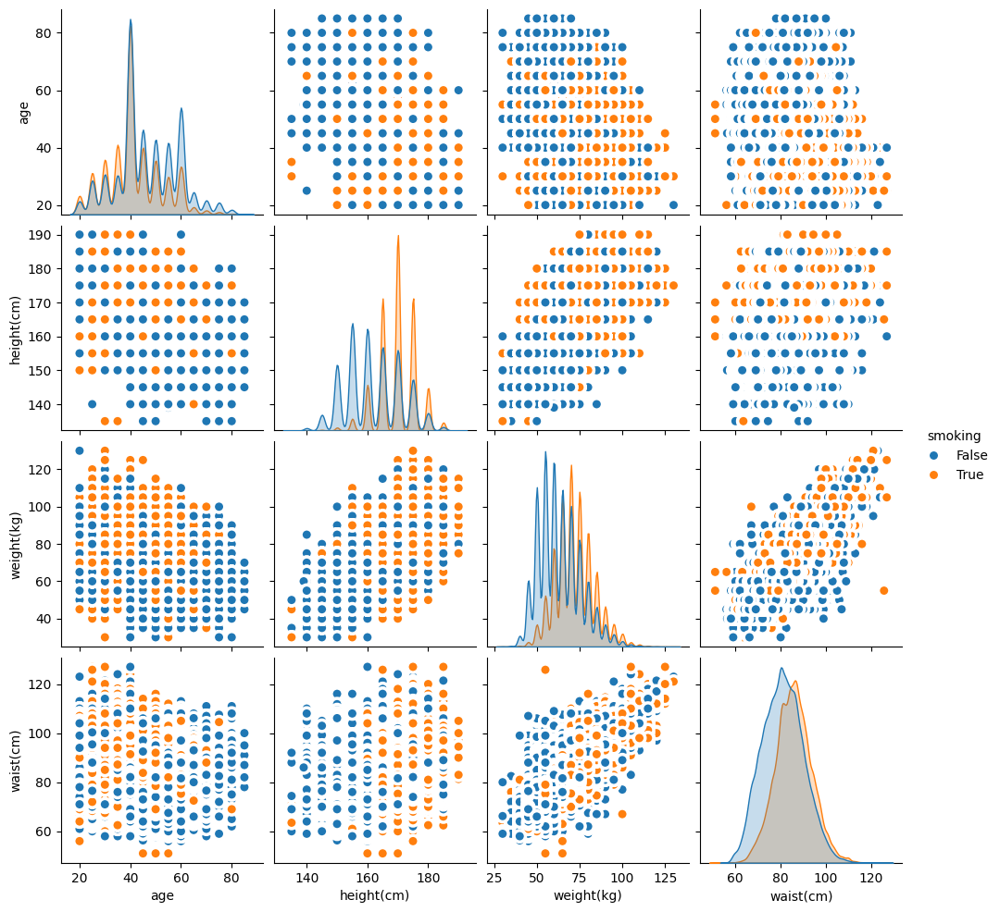

In [20]:
sns.pairplot(train_set1, kind='scatter', hue='smoking', plot_kws=dict(s=80, edgecolor='white', linewidth=2.5))
plt.show()

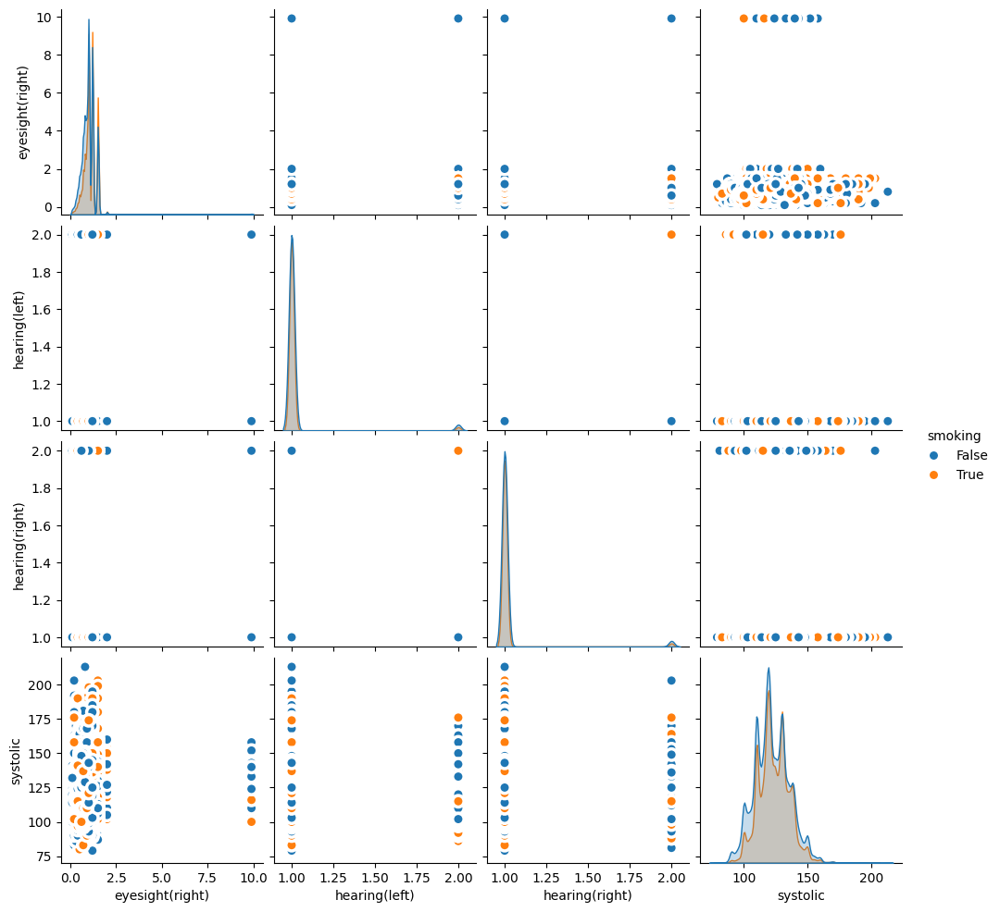

In [21]:
sns.pairplot(train_set2, kind='scatter', hue='smoking', plot_kws=dict(s=80, edgecolor='white', linewidth=2.5))
plt.show()

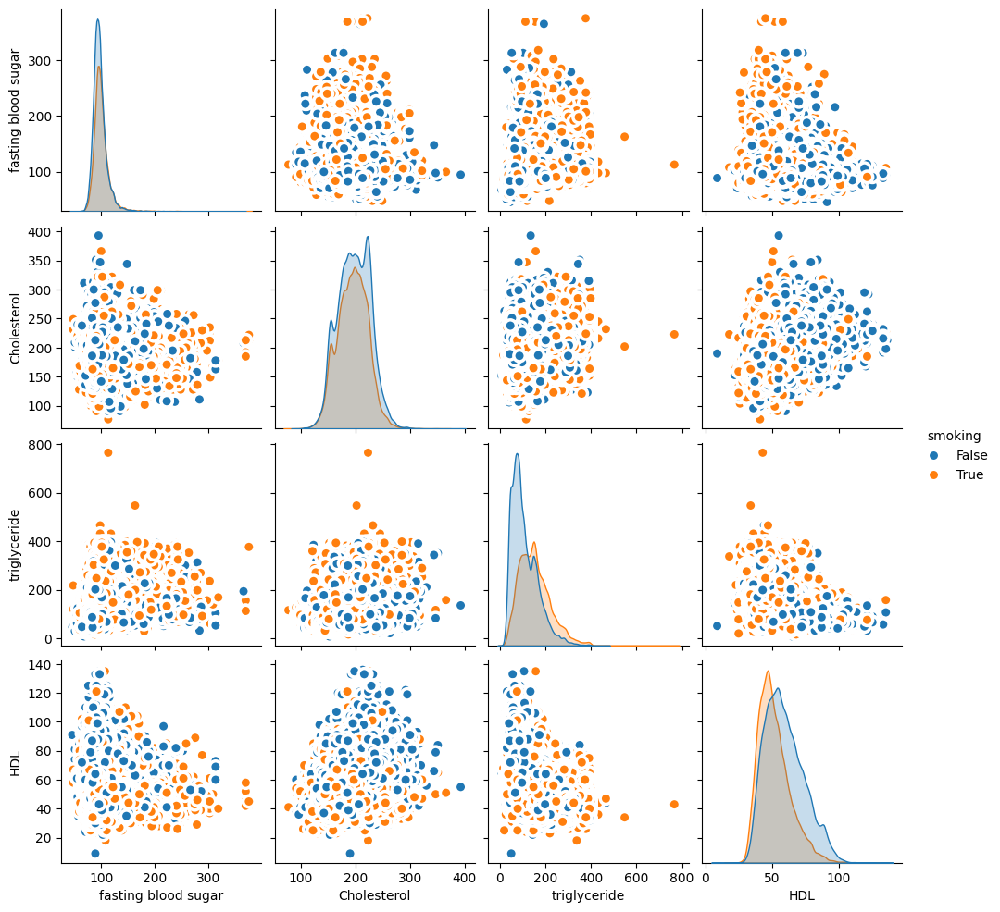

In [22]:
sns.pairplot(train_set3, kind='scatter', hue='smoking', plot_kws=dict(s=80, edgecolor='white', linewidth=2.5))
plt.show()

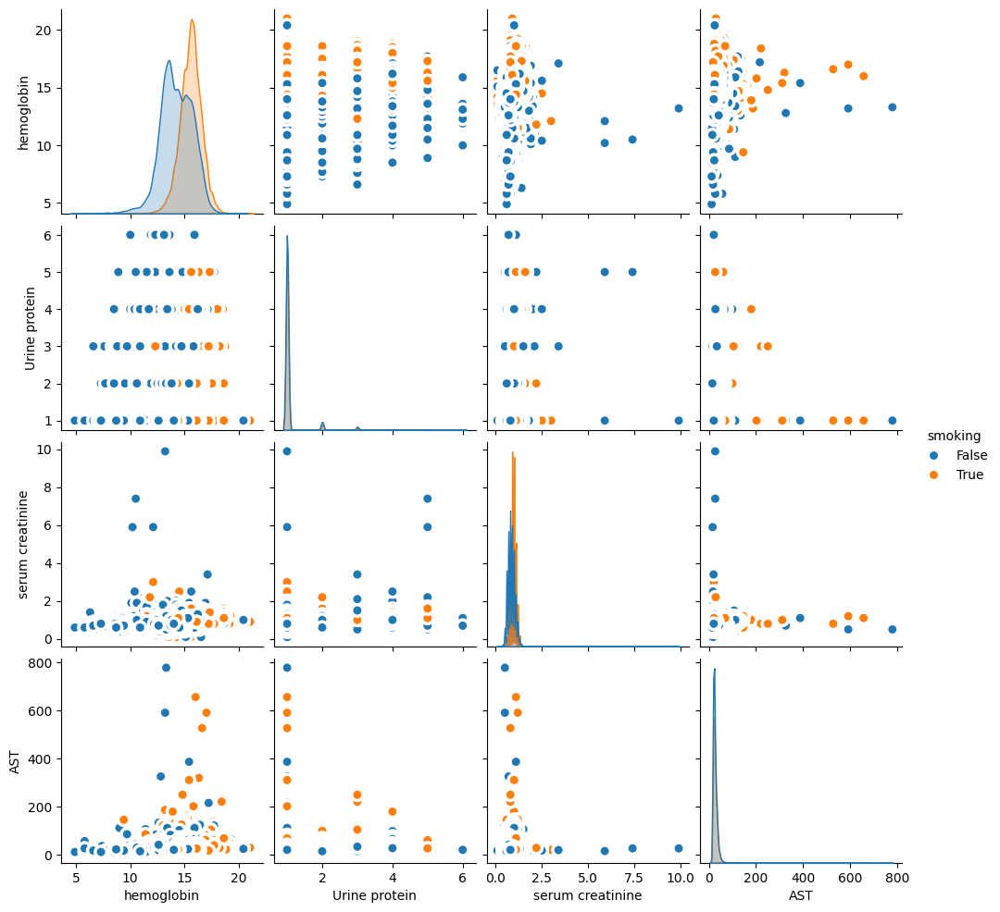

In [23]:
sns.pairplot(train_set4, kind='scatter', hue='smoking', plot_kws=dict(s=80, edgecolor='white', linewidth=2.5))
plt.show()

# Desarrollo de las Hipótesis

En este apartado plantearemos las hipótesis de que cada uno de los biomarcadores se ve afectado o no por la característica de si el sujeto es fumador o no. 

In [26]:
from scipy.stats import chi2_contingency

categorical_variables = ['hearing(left)', 'hearing(right)', 'Urine protein', 'dental caries']

for cat_var in categorical_variables:
    contingency_table = pd.crosstab(train[cat_var], train['smoking'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-cuadrado para {cat_var}: Estadística={chi2}, p-valor={p}")

Chi-cuadrado para hearing(left): Estadística=232.11914223131788, p-valor=2.0568471200329436e-52
Chi-cuadrado para hearing(right): Estadística=215.8562999432632, p-valor=7.248840567862082e-49
Chi-cuadrado para Urine protein: Estadística=170.7693784219107, p-valor=4.999670009924421e-35
Chi-cuadrado para dental caries: Estadística=1810.4064771591138, p-valor=0.0


Audición (izquierda y derecha): Los valores p muy bajos para ambas orejas indican una asociación significativa entre la capacidad auditiva y el hábito de fumar. Esto podría sugerir que fumar tiene un impacto negativo en la audición, aunque se necesitaría un análisis más profundo para entender la naturaleza de esta relación.

Proteína en Orina: El valor p también sugiere una fuerte asociación entre la presencia de proteína en la orina y el hábito de fumar. La proteína en la orina puede ser un indicador de daño renal, lo que podría implicar que el fumar afecta negativamente la salud renal.

Caries Dental: Con un valor p cercano a 0, este resultado indica una asociación extremadamente fuerte entre las caries dentales y el hábito de fumar. Esto puede reflejar el impacto negativo del tabaco en la salud dental.

In [28]:
def cramers_v(x, y):
    
    contingency_table = pd.crosstab(x, y)
    
    chi2, _, _, _ = chi2_contingency(contingency_table)
    
    n = contingency_table.sum().sum()
    phi2 = chi2 / n
    r, k = contingency_table.shape
    phi2_corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    r_corr = r - ((r-1)**2)/(n-1)
    k_corr = k - ((k-1)**2)/(n-1)
    cramer_v = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
    return cramer_v

for cat_var in categorical_variables:
    cramer_v_value = cramers_v(train[cat_var], train['smoking'])
    print(f"El coeficiente de Cramér V para {cat_var} y smoking es: {cramer_v_value}")

El coeficiente de Cramér V para hearing(left) y smoking es: 0.038095301440525205
El coeficiente de Cramér V para hearing(right) y smoking es: 0.03673055593681254
El coeficiente de Cramér V para Urine protein y smoking es: 0.03226306143997153
El coeficiente de Cramér V para dental caries y smoking es: 0.10659124414323926


Audición (izquierda y derecha): Los coeficientes para hearing(left) y hearing(right) son 0.038 y 0.037, respectivamente. Estos valores bajos indican que hay una asociación muy débil entre la capacidad auditiva (tanto izquierda como derecha) y el hábito de fumar. Aunque estadísticamente significativa, la relación no es fuerte.

Proteína en Orina: Con un coeficiente de 0.032, la asociación entre la presencia de proteína en la orina y el hábito de fumar también es débil. Esto sugiere que, aunque podría haber una relación entre el fumar y la salud renal (como se indica por la presencia de proteína en la orina), esta relación no es particularmente fuerte.

Caries Dental: El coeficiente de Cramér V para dental caries y fumar es 0.107, lo cual es más alto en comparación con las otras variables. Esto indica una asociación más notable entre las caries dentales y el hábito de fumar, aunque sigue siendo una asociación moderada. De todas las variables examinadas, la salud dental muestra la relación más fuerte con el hábito de fumar, lo cual es consistente con la literatura que sugiere que fumar puede tener efectos negativos en la salud bucal.

Implicaciones:

Aunque los coeficientes de Cramér V sugieren que la fuerza de la asociación entre estas variables y el hábito de fumar varía de débil a moderada, es importante considerar el impacto clínico y de salud pública de estas relaciones. Incluso una asociación débil, cuando se considera a nivel de población, puede tener implicaciones significativas para la salud pública.
La relación más fuerte observada con dental caries resalta la importancia de la salud bucal en el contexto del consumo de tabaco. Esto podría ser utilizado para informar intervenciones de salud pública y estrategias de prevención.
Estos resultados subrayan la importancia de considerar múltiples factores cuando se evalúa el impacto del tabaquismo en la salud. La inclusión de variables adicionales y el análisis de subgrupos pueden ayudar a esclarecer estas relaciones.

In [30]:
from scipy.stats import ttest_ind

# Lista de biomarcadores
numerical_variables = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)',
       'eyesight(right)', 'systolic','relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride',
       'HDL', 'LDL', 'hemoglobin', 'serum creatinine', 'AST','ALT', 'Gtp']

# Separar el DataFrame en fumadores y no fumadores
smokers = train[train['smoking'] == True]  
nonsmokers = train[train['smoking'] == False]

# Realizar la prueba T de Student para cada biomarcador
for variable in numerical_variables:
    smokers_values = smokers[variable]
    nonsmokers_values = nonsmokers[variable]
    
    t_stat, p_value = ttest_ind(smokers_values, nonsmokers_values, equal_var=False)
    
    print(f"{variable}: t-statistic = {t_stat}, p-value = {p_value}")


age: t-statistic = -85.28102754780164, p-value = 0.0
height(cm): t-statistic = 208.79414172015012, p-value = 0.0
weight(kg): t-statistic = 151.41464794959404, p-value = 0.0
waist(cm): t-statistic = 110.32367377024195, p-value = 0.0
eyesight(left): t-statistic = 40.84934156080615, p-value = 0.0
eyesight(right): t-statistic = 44.80485854332112, p-value = 0.0
systolic: t-statistic = 23.815334988927347, p-value = 3.871628242906292e-125
relaxation: t-statistic = 44.39174255307863, p-value = 0.0
fasting blood sugar: t-statistic = 37.92331081930428, p-value = 0.0
Cholesterol: t-statistic = -20.907362429816004, p-value = 6.265225322729711e-97
triglyceride: t-statistic = 137.5273475521544, p-value = 0.0
HDL: t-statistic = -115.12274979103907, p-value = 0.0
LDL: t-statistic = -29.30322414914799, p-value = 3.0739566937438765e-188
hemoglobin: t-statistic = 211.10924699342382, p-value = 0.0
serum creatinine: t-statistic = 116.95613605426739, p-value = 0.0
AST: t-statistic = 23.482957398543764, p-va

In [31]:
from scipy.stats import mannwhitneyu

# Realizar la prueba U de Mann-Whitney
for variable in numerical_variables:
    smokers_values = smokers[variable]
    nonsmokers_values = nonsmokers[variable]
    
    u_stat, p_value = mannwhitneyu(smokers_values, nonsmokers_values)
    
    print(f"{variable}: U-statistic = {u_stat}, p-value = {p_value}")

age: U-statistic = 2378031851.0, p-value = 0.0
height(cm): U-statistic = 4721067490.0, p-value = 0.0
weight(kg): U-statistic = 4441144100.5, p-value = 0.0
waist(cm): U-statistic = 4074885152.5, p-value = 0.0
eyesight(left): U-statistic = 3607737234.5, p-value = 0.0
eyesight(right): U-statistic = 3644679560.0, p-value = 0.0
systolic: U-statistic = 3348099886.0, p-value = 3.4477046650915e-138
relaxation: U-statistic = 3530516029.0, p-value = 0.0
fasting blood sugar: U-statistic = 3531427815.0, p-value = 0.0
Cholesterol: U-statistic = 2933752416.5, p-value = 1.2350890118419642e-93
triglyceride: U-statistic = 4387804816.0, p-value = 0.0
HDL: U-statistic = 2130169743.0, p-value = 0.0
LDL: U-statistic = 2851168507.5, p-value = 1.4107382661083765e-192
hemoglobin: U-statistic = 4781590094.0, p-value = 0.0
serum creatinine: U-statistic = 4161712215.5, p-value = 0.0
AST: U-statistic = 3384304325.0, p-value = 4.4334852565525843e-185
ALT: U-statistic = 3944261339.5, p-value = 0.0
Gtp: U-statistic 

In [34]:
train['smoking'] = train['smoking'].astype(int)

In [35]:
from scipy.stats import pearsonr, spearmanr

# Calcular y mostrar la correlación de Pearson y Spearman para cada biomarcador
for variable in numerical_variables:
    pearson_corr, p_value_pearson = pearsonr(train[variable], train['smoking'])
    spearman_corr, p_value_spearman = spearmanr(train[variable], train['smoking'])
    
    print(f"{variable}:")
    print(f"  Correlación de Pearson: coeficiente = {pearson_corr}, p-valor = {p_value_pearson}")
    print(f"  Correlación de Spearman: coeficiente = {spearman_corr}, p-valor = {p_value_spearman}\n")

age:
  Correlación de Pearson: coeficiente = -0.2060329588907718, p-valor = 0.0
  Correlación de Spearman: coeficiente = -0.20770978162996825, p-valor = 0.0

height(cm):
  Correlación de Pearson: coeficiente = 0.4471110538119112, p-valor = 0.0
  Correlación de Spearman: coeficiente = 0.44717474972408744, p-valor = 0.0

weight(kg):
  Correlación de Pearson: coeficiente = 0.3517478921857353, p-valor = 0.0
  Correlación de Spearman: coeficiente = 0.36619006036040186, p-valor = 0.0

waist(cm):
  Correlación de Pearson: coeficiente = 0.26271479402119197, p-valor = 0.0
  Correlación de Spearman: coeficiente = 0.2628453781410884, p-valor = 0.0

eyesight(left):
  Correlación de Pearson: coeficiente = 0.10041953896207659, p-valor = 0.0
  Correlación de Spearman: coeficiente = 0.13619483768750623, p-valor = 0.0

eyesight(right):
  Correlación de Pearson: coeficiente = 0.1097811961095625, p-valor = 0.0
  Correlación de Spearman: coeficiente = 0.1465348541105572, p-valor = 0.0

systolic:
  Correla

In [36]:
import statsmodels.api as sm

train['intercept'] = 1

# Modelo de regresión para cada biomarcador
results = []
for variable in numerical_variables:
    X = train[['smoking', 'intercept']]  # Variable independiente + intercepto
    y = train[variable]  # Variable dependiente
    model = sm.OLS(y, X).fit()  # Ajustar el modelo
    
    results.append({
        'Variable': variable,
        'Coeficiente': model.params['smoking'],
        'P-valor': model.pvalues['smoking']
    })

for result in results:
    print(f"{result['Variable']}: Coeficiente = {result['Coeficiente']}, P-valor = {result['P-valor']}")


age: Coeficiente = -4.918531881205481, P-valor = 0.0
height(cm): Coeficiente = 7.94870750106664, P-valor = 0.0
weight(kg): Coeficiente = 8.924611494900844, P-valor = 0.0
waist(cm): Coeficiente = 4.744121437799262, P-valor = 0.0
eyesight(left): Coeficiente = 0.08140089288772184, P-valor = 0.0
eyesight(right): Coeficiente = 0.08681763437625556, P-valor = 0.0
systolic: Coeficiente = 1.5047861933800706, P-valor = 2.547972594227894e-121
relaxation: Coeficiente = 1.9854787429915275, P-valor = 0.0
fasting blood sugar: Coeficiente = 2.9831856120890055, P-valor = 0.0
Cholesterol: Coeficiente = -2.9707728246689307, P-valor = 2.108707933292927e-95
triglyceride: Coeficiente = 44.29498064579016, P-valor = 0.0
HDL: Coeficiente = -7.6338598088930745, P-valor = 0.0
LDL: Coeficiente = -4.1032684339385055, P-valor = 1.874057558769401e-183
hemoglobin: Coeficiente = 1.300272980748976, P-valor = 0.0
serum creatinine: Coeficiente = 0.0986923469296483, P-valor = 0.0
AST: Coeficiente = 1.1332355441942021, P-v

## Conclusiones

El extenso análisis de los datos ha revelado varias asociaciones significativas entre el hábito de fumar y una amplia gama de biomarcadores de salud. Estos hallazgos subrayan cómo el tabaquismo puede afectar diversos aspectos de la salud física, desde la función renal y hepática hasta el metabolismo de la glucosa y los lípidos, así como la salud cardiovascular y ocular.

Conclusiones Clave
Influencia en la Función Auditiva y Dental: Los tests de Chi-cuadrado y los coeficientes de Cramér V indican que el hábito de fumar está significativamente asociado con problemas en la audición y mayores incidencias de caries dental. Esto sugiere que el tabaquismo no solo afecta a los sistemas más comúnmente asociados con su consumo (como el cardiovascular o respiratorio) sino también a aspectos más específicos de la salud.

Impacto en Medidas Físicas y Metabolismo: Los resultados de las pruebas t de Student, U de Mann-Whitney, y los modelos de regresión señalan relaciones significativas entre fumar y diversas medidas físicas (como peso, altura y circunferencia de cintura) y parámetros metabólicos (incluyendo glucosa en ayunas, perfil lipídico, hemoglobina y creatinina sérica). Estos hallazgos resaltan cómo el tabaquismo puede contribuir a alteraciones metabólicas y variaciones en la composición corporal.

Asociaciones con Biomarcadores de Salud: La correlación de Pearson y Spearman revela asociaciones significativas entre el tabaquismo y varios biomarcadores clave, incluyendo niveles elevados de enzimas hepáticas (AST, ALT, GTP) y cambios en los niveles de colesterol, lo cual puede indicar estrés hepático y desbalances en el perfil lipídico debido al tabaquismo.

Relaciones Diferenciales: Mientras que algunos biomarcadores muestran asociaciones positivas con el hábito de fumar (por ejemplo, triglicéridos y GTP), otros presentan relaciones negativas (como el colesterol HDL), lo que subraya la compleja influencia del tabaquismo en el cuerpo.

Implicaciones
Estos hallazgos confirman y amplían el entendimiento del impacto perjudicial del tabaquismo en la salud, demostrando que sus efectos adversos trascienden los sistemas cardiovascular y respiratorio para influir en una gama más amplia de condiciones de salud. La significativa asociación entre el tabaquismo y varios biomarcadores críticos para la salud resalta la importancia de las intervenciones para la cesación del tabaquismo como un componente clave de las estrategias de prevención y promoción de la salud pública.

Además, la detección de marcadores atípicos en una proporción significativa de la población estudiada sugiere la necesidad de un enfoque de salud más individualizado, donde las estrategias de intervención consideren la presencia de factores de riesgo múltiples y compuestos, incluyendo pero no limitándose al tabaquismo.

Con todo esto, podemos responder a las pregumtas que nos planteamos al proncipio:

A partir del Análisis Exploratorio de Datos (EDA) realizado, podemos abordar las preguntas planteadas de la siguiente manera:

### 1. **¿Qué biomarcadores están más correlacionados con el hecho de que el paciente fume?**
Los resultados de las correlaciones y las regresiones mostraron que biomarcadores como el GTP, los triglicéridos y la hemoglobina tienen fuertes relaciones con el hábito de fumar. Especialmente, el GTP y los triglicéridos mostraron coeficientes significativos en los modelos de regresión, sugiriendo que estos biomarcadores podrían estar más afectados por el hábito de fumar.

### 2. **¿Cuáles son las características demográficas de los fumadores en el conjunto de datos?**
A través de las pruebas estadísticas aplicadas, se encontró que características como la edad, el peso y la altura tienen diferencias significativas entre fumadores y no fumadores. Los coeficientes de regresión para la edad indican una relación negativa, lo que podría sugerir patrones específicos de fumadores en ciertos rangos de edad.

### 3. **¿Hay diferencias significativas en las medidas de salud (como presión arterial, niveles de colesterol) entre fumadores y no fumadores?**
Sí, las pruebas t de Student y las pruebas U de Mann-Whitney revelaron diferencias significativas en varias medidas de salud, incluyendo la presión arterial y los niveles de colesterol, entre fumadores y no fumadores. Estas diferencias sugieren que el hábito de fumar tiene un impacto notable en estas medidas de salud.

### 4. **¿Existen factores de riesgo identificables para ser fumador que puedan ser revelados por el conjunto de datos?**
Los análisis mostraron que ciertos biomarcadores y características demográficas están asociados con ser fumador. Por ejemplo, el aumento de los niveles de GTP y triglicéridos, así como ciertas distribuciones de edad, pueden considerarse como factores de riesgo asociados al hábito de fumar.

### 5. **¿Hay valores atípicos o anomalías en los datos que necesiten ser investigados o tratados?**
El análisis identificó una cantidad significativa de valores atípicos en varios biomarcadores. Esto sugiere que podría ser necesario investigar más a fondo estas anomalías o considerar su tratamiento (por ejemplo, a través de la imputación o la exclusión) para mejorar la calidad del análisis predictivo.

### 6. **¿Las bioseñales muestran alguna irregularidad inesperada que necesite una exploración más profunda?**
Los valores atípicos en biomarcadores como GTP, triglicéridos y hemoglobina, junto con las fuertes correlaciones encontradas, sugieren la presencia de irregularidades que podrían necesitar una exploración más detallada para entender completamente su naturaleza y causas.

### 7. **¿Cómo el hábito de fumar afecta otras variables de salud en el conjunto de datos?**
El análisis sugiere que el hábito de fumar afecta negativamente varias medidas de salud. Por ejemplo, los fumadores tienden a tener mayores niveles de GTP y triglicéridos, lo que puede indicar una peor función hepática y un mayor riesgo cardiovascular. Además, la relación negativa entre fumar y ciertos biomarcadores como HDL (colesterol bueno) enfatiza el impacto adverso del fumar en la salud cardiovascular.

------------------------------------------

Estas conclusiones derivadas del EDA ofrecen una base sólida para la preparación del modelo predictivo, permitiendo identificar las variables más relevantes a considerar y destacando la importancia de tratar valores atípicos y anomalías para mejorar la precisión del modelo. La identificación de biomarcadores clave y factores de riesgo asociados al hábito de fumar también puede guiar intervenciones específicas y políticas de salud pública dirigidas a poblaciones en riesgo.

En resumen, este análisis exhaustivo subraya la urgente necesidad de abordar el tabaquismo no solo por sus efectos conocidos en enfermedades crónicas establecidas, sino también por su influencia en un espectro más amplio de indicadores de salud, promoviendo así enfoques holísticos y multifacéticos para el mejoramiento de la salud pública.

<div style="text-align: center;">
    <a href="Modelo.ipynb">
        <button style="padding: 10px 20px; font-size: 16px; cursor: pointer;">Creación y entrenamiento del modelo</button>
    </a>
</div>